
# <font size="+3"><span style='color:#5c2835'> **P6 - Classifiez automatiquement des biens de consommation** </span></font>


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


---
---

<font size="+2" color="black"><b>**LOADING LIBRAIRIES**</b></font><br><a name="LOADING_LIBRARIES"></a>

---

In [2]:

# ----------------
# Packages Update
# ----------------
!pip install pandarallel
!pip install transformers
!pip install opencv-python
!pip install opencv-contrib-python

#!pip install --upgrade pip

# Builtin
import os
import glob
import pandas as pd
import numpy as np
import csv
from pprint import pprint
import time
import datetime
from math import pi
from pandarallel import pandarallel
import multiprocessing
import re
import cv2

# NLP
import nltk
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize, wordpunct_tokenize
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
import spacy

# Extraction des features texte
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
# Traitement texte
import gensim
from gensim.models import Word2Vec
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

from tensorflow.keras import backend as K
from tensorflow.keras import metrics as kmetrics


# Extraction des features image
from PIL import Image, ImageOps


# Implementation VGG-16
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, auc, roc_auc_score, roc_curve
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout 
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

# Bert
import transformers
from transformers import *
from transformers import DistilBertTokenizer, TFDistilBertModel

# Data visualisation
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.image import imread
%matplotlib inline
from os import listdir
import seaborn as sns
import wordcloud
from wordcloud import WordCloud
from PIL import Image

# Réduction dimensions
from sklearn import manifold, decomposition
from sklearn.manifold import TSNE

# Clustering
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics.cluster import adjusted_rand_score, homogeneity_score, completeness_score, v_measure_score


now = datetime.datetime.now().isoformat()
print('Launched on : ' + now)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 4.6 MB/s eta 0:00:00
  Created wheel for pandarallel: filename=pandarallel-1.6.5-py3-none-any.whl size=16677 sha256=a047e3ebdb7f1f8b51893c947aaad1bbbf4063c928c0460c2dbde9a5caecd3bc
  Stored in directory: /root/.cache/pip/wheels/50/4f/1e/34e057bb868842209f1623f195b74fd7eda229308a7352d47f
Successfully built pandarallel
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.6 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple,

/usr/local/lib/python3.10/dist-packages/transformers/generation_utils.py:24: FutureWarning: Importing `GenerationMixin` from `src/transformers/generation_utils.py` is deprecated and will be removed in Transformers v5. Import as `from transformers import GenerationMixin` instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation_tf_utils.py:24: FutureWarning: Importing `TFGenerationMixin` from `src/transformers/generation_tf_utils.py` is deprecated and will be removed in Transformers v5. Import as `from transformers import TFGenerationMixin` instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation_flax_utils.py:24: FutureWarning: Importing `FlaxGenerationMixin` from `src/transformers/generation_flax_utils.py` is deprecated and will be removed in Transformers v5. Import as `from transformers import FlaxGenerationMixin` instead.
  warnings.warn(
Xformers is not installed correctly. If you want to use memorry_efficient_attenti

Launched on : 2023-05-22T11:45:41.305370


---
---

<font size="+1" color="black"><b>DOWNLOADS ET OPTIONS</b></font><br><a id="downloads_opt"></a>

---

In [3]:
# Downloads

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('words')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


True

In [4]:
# pandarallel
pandarallel.initialize(progress_bar=True, nb_workers=7)

INFO: Pandarallel will run on 7 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


---
---

<font size="+1" color="black"><b>FUNCTIONS USED IN THIS NOTEBOOK</b></font><br><a name="USED_FUNCTIONS"></a>

---


In [5]:
# --------------------------------------------------------------------
# Analyse en composantes principales - Réduction de dimension
# --------------------------------------------------------------------

def reduire_dimension_acp(matrice, n_components=0):
    '''
    Analyse en composante principale
    Parameters
    ----------
    matrice : Variable à analyser, obligatoire
    n_components : nombre de composants pour la réduction de dimension
    exemple :  PC1/PC2 et PC3/PC4 ==> [(0, 1), (2, 3)], obligatoire
    affiche_graph : affiche les autres graphiques ; éboulis, distribution...
    Returns
    -------
    None.
    '''
    # Sélection des colonnes pour l'ACP
    cols_acp = matrice.columns.to_list()
    # Nombre de composantes
    if n_components == 0:
        n_comp = len(cols_acp)
    else:
        n_comp = n_components

    # Calcul des composantes principales
    pca = decomposition.PCA(n_components=n_comp)
    pca.fit(matrice)

    # quel est le pourcentage de variance préservé par chacune de
    # nos composantes?
    variances = pca.explained_variance_ratio_

    # quelle est la somme cumulée de chacune de ces variances?
    meilleur_dims = np.cumsum(variances)

    # on va trouver le moment où on atteint 90% ou 95% entre réduire au maxi
    # où garder au maxi

    # argmax pour > 90 %
    best90 = np.argmax(meilleur_dims > 0.9)

    # argmax pour > 95 %
    best = np.argmax(meilleur_dims > 0.99)

    display(f'Nombre de composantes expliquant 90% de la variance : {best90}')
    display(f'Nombre de composantes expliquant 99% de la variance : {best}')

In [6]:
# Definitions utiles pour l'implementation des analyses
# ------------------------------------------------------

# Noms des colonnes dans le df de l'analyse
cols = ["VAR1", "VAR2"]

# Dataframe de sauvegarde des résultats des métriques KMeans
df_metrics_kmeans = pd.DataFrame()

# Dataframe de sauvegarde des metrics pour
# la comparaison des performances des mèthodes
df_compar_method = pd.DataFrame()

In [7]:
# --------------------------------------------------------------------
# -- CALCUL DES METRIQUES K-Means
# --------------------------------------------------------------------

def calcul_metrics_kmeans(data, dataframe_metrique, type_donnees,
                          random_seed, ninit, maxiter):
    '''
    Calcul des métriques de KMeans en fonction de différents paramètres.
    Parameters
    ----------
    data : données, obligatoire.
    dataframe_metrique : dataframe de sauvegarde des résultats, obligatoire.
    type_donnees : string intitulé des données, obligatoire.
    random_seed : nombre aléatoire pour la reproductibilité, obligatoire.
    ninit : nombre de clusters à initialiser, obligatoire.
    maxiter : type d'initialisation : 'k-means++' ou 'random'.
    Returns
    -------
    dataframe_metrique : résultat des métriques
    '''
    # Cette fonction permet de calculer le nombre de clusters le plus
    # optimal pour notre analyse : le coefficient de silhouette,
    # dispersion, indice de davies_bouldin
    silhouette = []
    dispersion = []
    davies_bouldin = []
    donnees = []
    temps = []

    result_ninit = []
    result_maxiter = []

    # Hyperparametre tuning

    ninit = ninit
    maxiter = maxiter

    # Recherche des hyperparamètres
    for var_ninit in ninit:

        for var_maxiter in maxiter:

            # Top début d'exécution
            time_start = time.time()

            # Initialisation de l'algorithme
            cls = KMeans(n_clusters=7,
                         n_init=var_ninit,
                         init='k-means++',
                         max_iter=var_maxiter,
                         random_state=random_seed)

            # Entraînement de l'algorithme
            cls.fit(data)

            # Prédictions
            preds = cls.predict(data)

            # Top fin d'exécution
            time_end = time.time()

            # Calcul du score de coefficient de silhouette
            silh = metrics.silhouette_score(data, preds)
            # Calcul la dispersion
            disp = cls.inertia_
            # Calcul de l'indice davies-bouldin
            db = metrics.davies_bouldin_score(data, preds)
            # Durée d'exécution
            time_execution = time_end - time_start

            silhouette.append(silh)
            dispersion.append(disp)
            davies_bouldin.append(db)
            donnees.append(type_donnees)
            temps.append(time_execution)

            result_ninit.append(var_ninit)
            result_maxiter.append(var_maxiter)

    dataframe_metrique = dataframe_metrique.append(pd.DataFrame({
        'Type_données': donnees,
        'n_init': result_ninit,
        'max_iter': result_maxiter,
        'coef_silh': silhouette,
        'dispersion': dispersion,
        'davies_bouldin': davies_bouldin,
        'Durée (s)': temps
    }), ignore_index=True)

    return dataframe_metrique

In [8]:
# --------------------------------------------------------------------
# SCATTERPLOT DE VISUALISATION DE TRANSFORMATION T-SNE en 2D
# --------------------------------------------------------------------
def affiche_tsne(results_list, liste_param, alpha=0.1):
    '''
    Affiche les résultats de la transformation Lt-SNE
    -----------
    @ Parameters
    * results_list : iste des résultats de la transformation t-SNE
    * liste_param : liste des valeurs de l'hyper paramètre perplexity testées

    -----------
    @ Returns
    * Scatterplots
    '''

    i = 0

    # Visualisation en 2D des différents résultats selon la perplexité
    plt.subplots(6, 2, figsize=[12, 28])

    for resultat_tsne in results_list:
        plt.subplot(6, 2, i + 1)
        tsne_results_i = results_list[i]
        sns.scatterplot(x=tsne_results_i[:, 0], y=tsne_results_i[:, 1],
                        alpha=alpha)
        plt.title('t-SNE avec perplexité=' + str(liste_param[i]))
        plt.grid(False)
        plt.plot()

        i += 1

    plt.show()

In [9]:
# Détermination clusters après PCA et calcul ARI entre
# vrai catégorie et n° de clusters

def ARI_fct(X_proj, Method, init_method, Ninit, m_iter,
            df_donnees, df_analyse, df_comparatif) :

    """
    ----------
    @Paramètres:
    * X_proj : datamatrix, X_proj
    * Method : string, nom de la mèthode utilisée
    * init_method : methode d'initialisation : 'k-means++' ou 'random'
    * Ninit : int, nombre de clusters à l'initialisation
    * m_iter : int, Nombre maximal d'itérations de l'algorithme k-means
               pour une seule exécution
    * df_donnees : df avec l'information des catégories reelles
    * df_analyse: nom du df pour enregistrer les résultats
    * df_comparatif: nom du df pour enregistrer les paramètres pour
                     la comparaison des performances
    """
    
    ari_score = []
    temps_calcule = []
    nom_methode = []

    time1 = time.time()

    # Dataframe pour clustering
    df_analyse = pd.DataFrame({"VAR1" : X_proj[:, 0],
                               "VAR2": X_proj[:, 1],
                               "CATEGORIE" : df_donnees.Categ_N0})

    num_labels=len(l_cat)
    # Instantiation du modèle k-means
    cls = KMeans(n_clusters=num_labels, init=init_method, n_init=Ninit,
                 random_state=seed, max_iter=m_iter)
    cls.fit(df_analyse[cols])
    # Ajout de l'assignation du cluster au dataframe
    df_analyse["Clusters"] = cls.labels_
    kmeans_labels = cls.labels_
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_),4)
    time2 = np.round(time.time() - time1,4)

    nom_methode.append(Method)
    ari_score.append(ARI)
    temps_calcule.append(time2)

    df_comparatif = pd.concat([df_comparatif, (pd.DataFrame(
                                    {"Method_used": nom_methode,
                                     "ARI_score" : ari_score,
                                     "Computing_time": temps_calcule}))],
                              axis =0)

    return ARI, kmeans_labels, df_analyse, df_comparatif

In [10]:
# ------------------------------------------------------------
# Scatterplot ACP selon les vraies catégories et les clusters
# ------------------------------------------------------------
def dimReduc_visu_fct(X_projected, y_cat_num, labels, ARI, methode):
    '''
    Affiche la projection scatterplot par catégories et clusters.
    -----------
    @Parameters
    * X_projected : Datamatrix après projection, obligatoire.
    * labels : la variable représentant les clusters.
    * methode : str, nom de la methode de reduction de dimensions
    --------
    @Returns
    Scatterplots
    '''
    fig = plt.figure(figsize=(15,6))

    # Scatterplot des catégories
    ax = fig.add_subplot(121)
    scatter = ax.scatter(x=X_projected[:,0], y=X_projected[:,1],
                         c=y_cat_num, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0],
              labels=l_cat, loc="best", title="Categorie")
    plt.title(methode + 'Représentation par catégories réelles')

    # Scatterplot des clusters
    ax = fig.add_subplot(122)
    scatter = ax.scatter(x=X_projected[:,0], y=X_projected[:,1],
                         c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels),
              loc="best", title="Clusters")
    plt.title(methode + 'Représentation par clusters')

    plt.show()
    print("ARI : ", ARI)

In [11]:
# -----------------------
#  AFFICHAGE PAR CLUSTER
# -----------------------


def affichage_clusters(dataframe, feature, tableau=True, graphDistsrib=True):

    """
     Displays the frequency table and a bar graph 
    @Params IN :
        dataframe : DataFrame, required
        feature : categorical variables to be analyzed, required
        tableau : booléen, True = displays the frequency table
        graphDistsrib : booléen,  True = displays the percentage distribution
        graph"""

    if tableau:
        df = dataframe[feature].value_counts().to_frame().reset_index()
        df = df.rename(columns={'index':feature, feature:'num_entries'})
        df['Frequency_%'] = 100*df['num_entries']/((dataframe.shape[0]))
        display(df.head(10).style.hide(axis="index"))

    if graphDistsrib:
        plt.figure(figsize=(4,4))
        df_graph = df.sort_values("Frequency_%", ascending=False).head(20)
        sns.barplot(data= df_graph, x= feature, y= "Frequency_%" ,
                    palette = "light:b_r")
        plt.title("Distribution of " + feature)
        plt.show()

%pycodestyle_off

---
---

<font size="+1" color="black"><b>PARAMETERS USED IN THIS NOTEBOOK</b></font><br><a name="USED_PARAMETERS"></a>

---

In [12]:
# Parameters used in this notebook

seed = 84

# palette
palette7 = ["#222b8f", "#9b5499", "#d996ae", "#ffe1e0", "#ffd0ad", "#ffd066",
            "#d7de00"]

# <font size="+3" color="black"><b>P6 - Classifiez automatiquement des biens de consommation</b></font><br><a name="context"></a>



Ce notebook fait partie u projet d'automamatisation de l'attibution de la catégorie d'un article sur le site ***place de marché***.

![logo](https://user.oc-static.com/upload/2019/02/24/15510259240381_Projet%20textimage%20logo.png)

L'objectif du projet est de<br>



---
---

**Ce notebook** inclut **le nettoyage et exploration des données**.<br>


---
---

<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<h3 class="list-group-item list-group-item-action active" data-toggle="list"  role="tab" aria-controls="home"><font size="+3" color="#903b3f"><b>Table de matières</b></font><br><a id="objective"></a></h3>

* [Librairies loading](#LOADING_LIBRARIES)
* [Functions used in this notebook](#USED_FUNCTIONS)   
* [Context](#context)  
* [1. Dataset](#datasets)
    - [1.1. Display](#dataset_display)
    - [1.2. Structure](#dataset_structure)
    - [1.3. Nan et doublons](#dataset_nan_doublons)
    - [1.4. Inspection des données](#dataset_describe)
    - [1.5. Idéntification et analyse catégories](#analyse_categorie)
* [2. Analyse faisabilité - Texte](#pre_processing_texte)
    - [2.1. Nettoyage texte](#nettoyage_texte)
        - [2.1.1. Mise en minuscule](#minuscules)
        - [2.1.2. Tokenization](#Tokenization)
        - [2.1.3. Suppression des mots de liaison](#stop_words)
        - [2.1.4. Suppression de la ponctuation et les caractères non alphabétiques](#ponctuation_nonAlpha)
        - [2.1.5. Filtre en fonction de la frequence des mots sur le corpus](#filtre_mots_rares_frequents)
        - [2.1.6. Suppression des mots avec moins de N charactères](#short_words)
        - [2.1.7. Stem and Lem](#stem_len)
        - [2.1.8. Mots communes à toutes les catégories](#mots_communes_toutes_categories)
    - [2.2. Fonctions de nettoyage](#fonctions_nettoyage)
        - [2.2.1. Bag of words](#bag_tokens)
        - [2.2.2. Nettoyage texte](#nettoyage_text)
        - [2.2.3. Préparation commune](#prep_commune)
    - [2.3. Extraction des features et analyse](#feature_extraction_analysis)
        - [2.3.1. Comptage simple des mots, CountVectorizer](#comptage_mots_simple)
        - [2.3.2. Tt-idf](#tfidf)
        - [2.3.3. Word2Vec](#word2vec)
        - [2.3.4. BERT](#bert)
        - [2.3.5. USE](#use)
    - [2.4. Comparaison des performances, analyse du texte](#comp_perform_texte)
* [3. Analyse faisabilité - Images](#faisab_img)
    - [3.1. Premier contact images](#prem_images)
    - [3.2. SIFT](#SIFT)
    - [3.3. VGG-16](#VGG16)
* [4. Comparaison des performances](#comp_perform_all)




---
---

# <font size="+3" color="#5c2835"><b>1. Dataset</b></font><br><a name="datasets"></a>


In [13]:
# Define the folder containing the files with the project data
P6_source = "/content/drive/MyDrive/Projet6_NLP/P6_travail/p6_source/"

os.chdir(P6_source)

# .csv files number and name
allFilesCsv = glob.glob('*.csv')

print("The data is divided into : " + str(len(allFilesCsv)) + " datasets.\n")
pprint("The available dataset are : " + str(allFilesCsv))

The data is divided into : 1 datasets.

"The available dataset are : ['flipkart_com-ecommerce_sample_1050.csv']"


## <font size="+2" color="#903b3f"><b>1.1. Display</b></font><br><a name="dataset_display"></a>

In [14]:
# -------------
# File upload:
# -------------
fn = P6_source + "flipkart_com-ecommerce_sample_1050.csv"
df_text = pd.read_csv(fn, low_memory=False, encoding='utf-8')

# --------------
# Dataset size
# --------------
print("The dataset contains " + str(df_text.shape[0]) + " rows and " +
      str(df_text.shape[1]) + " columns.\n")

# ---------------
# Data overview
# ---------------
# pd.options.display.max_columns = None
df_text.head(3)

The dataset contains 1050 rows and 15 columns.



,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."


In [15]:
df_text.tail(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."


In [16]:
df_text.sample(6)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
671,0ca8e323551dd7107ef57ef7c3e77aee,2015-12-31 09:19:31 +0000,http://www.flipkart.com/niksales-7-w-led-bulb/...,NIKsales 7 W LED Bulb,"[""Kitchen & Dining >> Lighting >> Bulbs >> NIK...",BLBEDZE5C9G5GDP8,750.0,365.0,0ca8e323551dd7107ef57ef7c3e77aee.jpg,False,Buy NIKsales 7 W LED Bulb for Rs.365 online. N...,No rating available,No rating available,NIKsales,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
353,b5b47b2ecf5cf5760051b0a980ed7a3f,2015-12-01 06:13:00 +0000,http://www.flipkart.com/asus-dsl-n10e-wireless...,Asus DSL-N10E Wireless-N150 ADSL Modem Router,"[""Computers >> Network Components >> Routers >...",RTRD7XKFRCZH8TE4,3690.0,2000.0,b5b47b2ecf5cf5760051b0a980ed7a3f.jpg,False,Buy Asus DSL-N10E Wireless-N150 ADSL Modem Rou...,4.2,4.2,Asus,"{""product_specification""=>[{""key""=>""Firewall"",..."
417,f74e1afad2c545c25ee38193d0eb87d5,2015-12-01 06:13:00 +0000,http://www.flipkart.com/yardley-12-combo-set/p...,Yardley 12 Combo Set,"[""Beauty and Personal Care >> Fragrances >> De...",CAGE52QHVSB7KTKG,378.0,378.0,f74e1afad2c545c25ee38193d0eb87d5.jpg,False,Flipkart.com: Buy Yardley 12 Combo Set online ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Number of ..."
196,40829ac110f344ef35f1c8c32fb311c7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/tatvaarts-urli-showpie...,Tatvaarts Urli Showpiece - 21.59 cm,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIEBZB4U7BKYJTU,6500.0,5700.0,40829ac110f344ef35f1c8c32fb311c7.jpg,False,"Tatvaarts Urli Showpiece - 21.59 cm (Brass, ...",No rating available,No rating available,Tatvaarts,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
732,2bf95e5f8c4d7d0126de92e476d4fc8b,2016-01-03 10:35:37 +0000,http://www.flipkart.com/sonpra-baby-boy-s-body...,Sonpra Baby Boy's Bodysuit,"[""Baby Care >> Infant Wear >> Baby Boys' Cloth...",BOLEE6ZGSCXFKTQY,1499.0,570.0,2bf95e5f8c4d7d0126de92e476d4fc8b.jpg,False,Sonpra Baby Boy's Bodysuit\r\n ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""value""=>""5 Cotton..."
893,526cb1e7675adb39a1ea68f1f2a3fd59,2015-12-20 08:26:17 +0000,http://www.flipkart.com/durga-home-trendz-cott...,Durga Home Trendz Cotton Hand Towel,"[""Home Furnishing >> Bath Linen >> Towels""]",BTWEDGMRHGQZKRZR,599.0,250.0,526cb1e7675adb39a1ea68f1f2a3fd59.jpg,False,Durga Home Trendz Cotton Hand Towel (Hand Towe...,No rating available,No rating available,Durga Home Trendz,"{""product_specification""=>[{""key""=>""Machine Wa..."


## <font size="+2" color="#903b3f"><b>1.2. Structure</b></font><br><a name="dataset_structure"></a>

In [17]:
# Dataframe info
df_text.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [18]:
df_text.dtypes.value_counts()

object     12
float64     2
bool        1
dtype: int64

In [19]:
# Nombre entrées unique par colonne
df_text.nunique().sort_values()

is_FK_Advantage_product       2
product_rating               27
overall_rating               27
crawl_timestamp             149
retail_price                354
discounted_price            424
brand                       490
product_category_tree       642
product_specifications      984
uniq_id                    1050
product_url                1050
product_name               1050
pid                        1050
image                      1050
description                1050
dtype: int64

## <font size="+2" color="#903b3f"><b>1.3. Nan et doublons</b></font><br><a name="dataset_nan_doublons"></a>

In [20]:
# Cellules vides par colonne
df_text.isna().mean().sort_values()

uniq_id                    0.000000
crawl_timestamp            0.000000
product_url                0.000000
product_name               0.000000
product_category_tree      0.000000
pid                        0.000000
image                      0.000000
is_FK_Advantage_product    0.000000
description                0.000000
product_rating             0.000000
overall_rating             0.000000
retail_price               0.000952
discounted_price           0.000952
product_specifications     0.000952
brand                      0.321905
dtype: float64

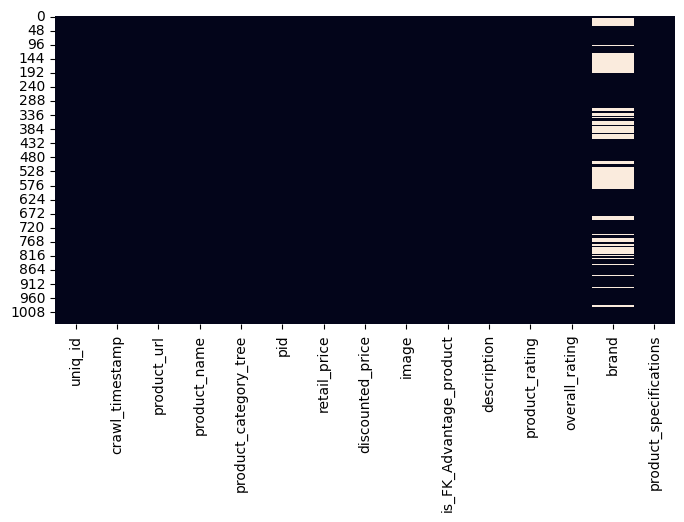

In [21]:
# ---------------------
# Missing values plot
# ---------------------
plt.figure(figsize=(8, 4))
sns.heatmap(df_text.isna(), cbar=False, cmap="rocket")
plt.show()

In [22]:
# Idéntification doublons dans les differentes lignes
for column in df_text.columns :
    n = df_text.duplicated(subset=column).sum()
    print(f"Colonne : {column} -> duplicated : {n}")

Colonne : uniq_id -> duplicated : 0
Colonne : crawl_timestamp -> duplicated : 901
Colonne : product_url -> duplicated : 0
Colonne : product_name -> duplicated : 0
Colonne : product_category_tree -> duplicated : 408
Colonne : pid -> duplicated : 0
Colonne : retail_price -> duplicated : 695
Colonne : discounted_price -> duplicated : 625
Colonne : image -> duplicated : 0
Colonne : is_FK_Advantage_product -> duplicated : 1048
Colonne : description -> duplicated : 0
Colonne : product_rating -> duplicated : 1023
Colonne : overall_rating -> duplicated : 1023
Colonne : brand -> duplicated : 559
Colonne : product_specifications -> duplicated : 65


<Axes: ylabel='product_category_tree'>

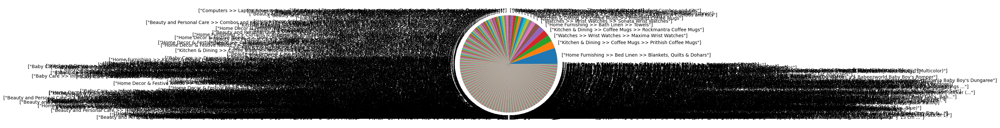

In [23]:
df_text["product_category_tree"].value_counts().plot(kind="pie")

In [24]:
id_doublons = df_text.duplicated(subset="product_category_tree", keep=False)
df_text.loc[id_doublons, :].sort_values("product_category_tree").head(6)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1044,be0f39341d771aac57084970f1ed6425,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE9F5UYBHF4MXU,1429.0,1143.0,be0f39341d771aac57084970f1ed6425.jpg,False,Buy Wallmantra Medium Vinyl Stickers Sticker f...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1041,b1644f47c7dfa58f8c06677f2a27ee09,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-extra-large...,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE9F5UFETEGPVY,1839.0,1216.0,b1644f47c7dfa58f8c06677f2a27ee09.jpg,False,Buy Wallmantra Extra Large Vinyl Stickers Stic...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."


## <font size="+2" color="#903b3f"><b>1.4. Inspection des données</b></font><br><a name="dataset_describe"></a>

In [25]:
df_text.describe(include=np.number)

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


In [26]:
df_text.describe(include=object)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,image,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,1050,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va..."
freq,1,150,1,1,56,1,1,1,889,889,11,22


## <font size="+2" color="#903b3f"><b>1.5. Idéntification et analyse catégories</b></font><br><a name="analyse_categorie"></a>

In [27]:
df_text["product_category_tree"].sort_values().unique()

array(['["Baby Care >> Baby & Kids Gifts >> Decorations >> Doraemon Gift Family Ceramic Coffee Mug Decorations >> Doraemon Gift Family Ceramic Coffee Mug Multicol..."]',
       '["Baby Care >> Baby & Kids Gifts >> Photo Frames >> Cocovey Photo Frames"]',
       '["Baby Care >> Baby & Kids Gifts >> Photo Frames >> Indha Craft Photo Frames"]',
       '["Baby Care >> Baby & Kids Gifts >> Photo Frames >> MH Photo Frames"]',
       '["Baby Care >> Baby & Kids Gifts >> Photo Frames >> Wood Beauty Photo Frames"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> 999store Stickers"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> Elite Collection Stickers"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> Oren Empower Stickers"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> Uberlyfe Stickers"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> WallDesign Stickers"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> Wallmantra Stickers"]',
   

In [28]:
# Regex expresion pour supprimer '["' et '"]'
def supprimer_crochets(text):
    croch_ini = re.sub('(\[")', '', text)
    return re.sub('(\"])', '', croch_ini)

In [29]:
# Regex expresion pour supprimer '["' et '"]'

df_text["product_category_tree"] = df_text["product_category_tree"]\
                                    .apply(supprimer_crochets)

In [30]:
# Spliter la chaine de caracteres à "">>" et créer une colonne
# pour chaque niveau de l'arbre de catégories
df_catg = df_text["product_category_tree"].str.split(" >> ", expand=True)

df_catg = df_catg.rename(columns={0: "Categ_N0", 1: "Categ_N1", 2: "Categ_N2",
                                  3: "Categ_N3", 4: "Categ_N4", 5: "Categ_N5",
                                  6: "Categ_N6"})
df_catg.sample(6)

,Categ_N0,Categ_N1,Categ_N2,Categ_N3,Categ_N4,Categ_N5,Categ_N6
622,Baby Care,Diapering & Potty Training,Diaper Bags,Mee Mee Diaper Bags,Mee Mee Multifunctional Nursery Diaper Bag (Da...,None,None
732,Baby Care,Infant Wear,Baby Boys' Clothes,Bodysuits & Sleepsuits,Bodysuits,Sonpra Bodysuits,None
115,Computers,Computer Peripherals,Printers & Inks,Toners,Filink Toners,None,None
866,Beauty and Personal Care,Men's Grooming,Sivanna Men's Grooming,Sivanna Baking Powder Rouge Highlighter (Dark...,None,None,None
559,Watches,Wrist Watches,Times Wrist Watches,None,None,None,None
150,Kitchen & Dining,Coffee Mugs,Printland Coffee Mugs,None,None,None,None


In [31]:
# Cellules vides par colonne
df_catg.isna().mean().sort_values()

Categ_N0    0.000000
Categ_N1    0.000000
Categ_N2    0.002857
Categ_N3    0.353333
Categ_N4    0.614286
Categ_N5    0.879048
Categ_N6    0.945714
dtype: float64

In [32]:
# Nombre de catégories par niveau
df_catg.nunique()

Categ_N0      7
Categ_N1     62
Categ_N2    241
Categ_N3    349
Categ_N4    297
Categ_N5    117
Categ_N6     57
dtype: int64

In [33]:
# Réunir ce tableau avec les colonnes texte d'intêret
df_text = df_text.reset_index()
df_catg = df_catg.reset_index()

df_text_analysis = df_text.merge(df_catg, on="index", how="left")

df_text_analysis = df_text_analysis.drop(columns="index")
df_text = df_text.drop(columns="index")
df_catg = df_catg.drop(columns="index")

In [34]:
# Nombre de catégories Niveau 0
len(df_text_analysis["Categ_N0"].sort_values().unique())

7

<Axes: ylabel='Categ_N0'>

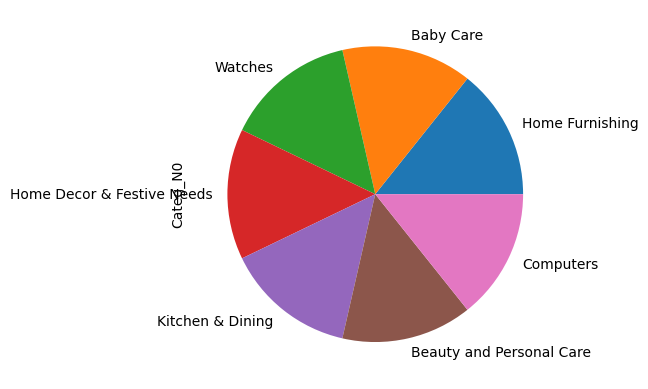

In [35]:
# Distribution des documents
df_text_analysis["Categ_N0"].value_counts().plot(kind="pie")

---
---

# <font size="+3" color="#5c2835"><b>2. Analyse faisabilité - Texte</b></font><br><a name="pre_processing_texte"></a>

In [36]:
df_text_analysis[["description", "product_name", "product_specifications"]]\
                                                                      .head()

,description,product_name,product_specifications
0,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set,"{""product_specification""=>[{""key""=>""Material"",..."
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [37]:
# Réunir les variables considerées dans une seule
df_text_analysis["to_preprocess"] = df_text_analysis["description"]\
                                + df_text_analysis["product_name"]\
                                + df_text_analysis["product_specifications"]

In [38]:
# créer un subéchantillon pour tester la tokenisation
df_token_test = df_text_analysis[["Categ_N0", "to_preprocess"]]
df_token_test = df_token_test.sample(frac=0.3, random_state=seed)

In [39]:
# Sélection d'une description d'exemple
doc1 = df_token_test["to_preprocess"].sample(1, random_state=seed)
doc1 = doc1.values[0]
doc1

'Memore Portable and Flexible LED Light Lamp MMULL-SkyBlue USB Led Light (Blue)\r\n                         Price: Rs. 190\r\n\t\t\t\t\r\n\t\t\t1. 100% Brand New And High Quality. 2. Perfect Fit For Reading. 3. Light Weight And Durable Cover. 4. Portable And Multiple Choice Of Color. 5. Flexible And Easy Clean. 6. Rated Voltage: 5v 7. Rated Power: 1.2w 8. Size: 170*18.5*9mm 9. Can Be Use On Any Where,Powered By Any Devices With Usb Port 10. Ultra Bright With Low Power Consumption 11. Unique Bendable Design,Also Has Light Weight 12. Material: Silicone\r\n1. 100% Brand New And High Quality. 2. Perfect Fit For Reading. 3. Light Weight And Durable Cover. 4. Portable And Multiple Choice Of Color. 5. Flexible And Easy Clean. 6. Rated Voltage: 5v 7. Rated Power: 1.2w 8. Size: 170*18.5*9mm 9. Can Be Use On Any Where,Powered By Any Devices With Usb Port 10. Ultra Bright With Low Power Consumption 11. Unique Bendable Design,Also Has Light Weight 12. Material: SiliconeMemore Portable and Flexible

## <font size="+2" color="#903b3f"><b>2.1. Nettoyage texte</b></font><br><a name="nettoyage_texte"></a>

### <font size="+2" color="#c0553d"><b>2.1.1. Mise en minuscule<b></font><br><a name="minuscules"></a>

In [40]:
# minuscules
def lower_case(text):
    lw_text = text.lower().strip()
    return lw_text

In [41]:
# minuscules
doc1 = lower_case(doc1)
doc1

'memore portable and flexible led light lamp mmull-skyblue usb led light (blue)\r\n                         price: rs. 190\r\n\t\t\t\t\r\n\t\t\t1. 100% brand new and high quality. 2. perfect fit for reading. 3. light weight and durable cover. 4. portable and multiple choice of color. 5. flexible and easy clean. 6. rated voltage: 5v 7. rated power: 1.2w 8. size: 170*18.5*9mm 9. can be use on any where,powered by any devices with usb port 10. ultra bright with low power consumption 11. unique bendable design,also has light weight 12. material: silicone\r\n1. 100% brand new and high quality. 2. perfect fit for reading. 3. light weight and durable cover. 4. portable and multiple choice of color. 5. flexible and easy clean. 6. rated voltage: 5v 7. rated power: 1.2w 8. size: 170*18.5*9mm 9. can be use on any where,powered by any devices with usb port 10. ultra bright with low power consumption 11. unique bendable design,also has light weight 12. material: siliconememore portable and flexible

### <font size="+2" color="#c0553d"><b>2.1.2. Tokenization<b></font><br><a name="Tokenization"></a>

In [42]:
def display_tokens_info(tokens):
    """display info about corups """

    print(f"nb tokens {len(tokens)}, nb tokens uniques {len(set(tokens))}")
    print(tokens[:30])

In [43]:
def w_token(text):
    w_tokens = word_tokenize(text)
    return w_tokens

In [44]:
# 1er essai tokenisation
w_tokens = w_token(doc1)
display_tokens_info(w_tokens)

nb tokens 542, nb tokens uniques 120
['memore', 'portable', 'and', 'flexible', 'led', 'light', 'lamp', 'mmull-skyblue', 'usb', 'led', 'light', '(', 'blue', ')', 'price', ':', 'rs', '.', '190', '1', '.', '100', '%', 'brand', 'new', 'and', 'high', 'quality', '.', '2.']


In [45]:
def wp_token(text):
    wp_tokens = wordpunct_tokenize(text)
    return wp_tokens

In [46]:
# Un autre exemple tokenize
wp_tokens = wp_token(doc1)
display_tokens_info(wp_tokens)

nb tokens 424, nb tokens uniques 120
['memore', 'portable', 'and', 'flexible', 'led', 'light', 'lamp', 'mmull', '-', 'skyblue', 'usb', 'led', 'light', '(', 'blue', ')', 'price', ':', 'rs', '.', '190', '1', '.', '100', '%', 'brand', 'new', 'and', 'high', 'quality']


### <font size="+2" color="#c0553d"><b>2.1.3. Suppression des mots de liaison<b></font><br><a name="stop_words"></a>

In [47]:
# Definir liste des mots de liaison
# liste de NTLK
stop_words_NTLK = set(stopwords.words("english"))
len(stop_words_NTLK)

179

In [48]:
# Liste des mots de liaison anglais in Github
f = open("english_github.txt", 'r+', encoding="utf-8")
with f as file:
    stop_words_GitHub = [stop_word.rstrip() for stop_word in file]
len(stop_words_GitHub)

1298

In [49]:
# Liste des mots de liaison anglais in Kaggle
with open("stopwords_kaggle.txt") as file:
    stop_words_kaggle = [stop_word.rstrip() for stop_word in file]
len(stop_words_kaggle)

733

In [50]:
# Combination des listes
in_stop_words_NTLK = set(stop_words_NTLK)
in_stop_words_GitHub = set(stop_words_GitHub)
in_stop_words_kaggle = set(stop_words_kaggle)

in_GitHub_but_not_in_NLTK = in_stop_words_GitHub - in_stop_words_NTLK
in_kaggle_but_not_in_others = in_stop_words_kaggle - in_GitHub_but_not_in_NLTK

all_stop_words = list(stop_words_NTLK)\
               + list(in_GitHub_but_not_in_NLTK)\
               + list(in_kaggle_but_not_in_others)
len(all_stop_words)

1780

In [51]:
def stop_word_filter_fct(list_words) :
    filtered_w = [w for w in list_words if not w in all_stop_words]
    return filtered_w

In [52]:
tokens_w_filter = stop_word_filter_fct(w_tokens)

display_tokens_info(tokens_w_filter)

nb tokens 470, nb tokens uniques 94
['memore', 'portable', 'flexible', 'led', 'light', 'lamp', 'mmull-skyblue', 'usb', 'led', 'light', '(', 'blue', ')', 'price', ':', 'rs', '.', '190', '1', '.', '100', '%', 'brand', 'quality', '.', '2.', 'perfect', 'fit', 'reading', '.']


In [53]:
tokens_wp_filter = stop_word_filter_fct(wp_tokens)

display_tokens_info(tokens_wp_filter)

nb tokens 350, nb tokens uniques 93
['memore', 'portable', 'flexible', 'led', 'light', 'lamp', 'mmull', '-', 'skyblue', 'usb', 'led', 'light', '(', 'blue', ')', 'price', ':', 'rs', '.', '190', '1', '.', '100', '%', 'brand', 'quality', '.', '2', '.', 'perfect']


### <font size="+2" color="#c0553d"><b>2.1.4. Suppression de la ponctuation et les caractères non alphabétiques<b></font><br><a name="ponctuation_nonAlpha"></a>

In [54]:
def alpha_filter_fct(list_words) :
    filtered_alpha_w = [w for w in list_words if w.isalpha()]
    return filtered_alpha_w

In [55]:
# Suppression de la ponctuation et les caractères non alphabétiques
filtered_alpha_w = alpha_filter_fct(tokens_w_filter)

display_tokens_info(filtered_alpha_w)

nb tokens 144, nb tokens uniques 55
['memore', 'portable', 'flexible', 'led', 'light', 'lamp', 'usb', 'led', 'light', 'blue', 'price', 'rs', 'brand', 'quality', 'perfect', 'fit', 'reading', 'light', 'weight', 'durable', 'cover', 'portable', 'multiple', 'choice', 'color', 'flexible', 'easy', 'clean', 'rated', 'voltage']


In [56]:
# Suppression de la ponctuation et les caractères non alphabétiques
filtered_alpha_wp = alpha_filter_fct(tokens_wp_filter)

display_tokens_info(filtered_alpha_wp)

nb tokens 150, nb tokens uniques 57
['memore', 'portable', 'flexible', 'led', 'light', 'lamp', 'mmull', 'skyblue', 'usb', 'led', 'light', 'blue', 'price', 'rs', 'brand', 'quality', 'perfect', 'fit', 'reading', 'light', 'weight', 'durable', 'cover', 'portable', 'multiple', 'choice', 'color', 'flexible', 'easy', 'clean']


### <font size="+2" color="#c0553d"><b>2.1.5. Filtre en fonction de la frequence des mots sur le corpus<b></font><br><a name="filtre_mots_rares_frequents"></a>

Il y a deux cas ou la frequence des mots à un impacte sur leur interêt : 
* les mots rares, leur basse frequence leur rends inutiles
* les mots les plus frequents, le fait d'être presents dans tous les documents documents les rend inutiles pour caractériser l'un d'entre eux

In [57]:
# Construction corpus brut
# réunir tous les corpus
raw_corpus = " ".join(df_text_analysis["description"].values)
raw_corpus[:1_000]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

<span style='background:#e6792e'><span style='color:white'>word_tokenize</span></span>

In [58]:
# Mise en minuscules
raw_corpus = lower_case(raw_corpus)

# Exemple tokenization + nettoyage
tokens_corpus = w_token(raw_corpus)

# Suppression mots de liaison
filtered_corpus = stop_word_filter_fct(tokens_corpus)

# Suppression de la ponctuation et les caractères non alphabétiques
filtered_alpha_corpus_w = alpha_filter_fct(filtered_corpus)

test_corpus_tokens = ' '.join(filtered_alpha_corpus_w)

In [59]:
display_tokens_info(filtered_alpha_corpus_w)

nb tokens 43956, nb tokens uniques 4358
['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'rs', 'curtain', 'enhances', 'curtain', 'quality', 'polyester', 'features', 'eyelet', 'style']


In [60]:
# Nombre occurrences token
tmp_w = pd.Series(filtered_alpha_corpus_w, dtype="object").value_counts()
tmp_w

products       630
rs             592
delivery       567
shipping       564
cash           564
              ... 
onboard          1
moonleaf         1
houseattire      1
nativity         1
marco            1
Length: 4358, dtype: int64

In [61]:
tmp_w.describe()

count    4358.000000
mean       10.086278
std        37.263527
min         1.000000
25%         1.000000
50%         2.000000
75%         6.000000
max       630.000000
dtype: float64

<Axes: >

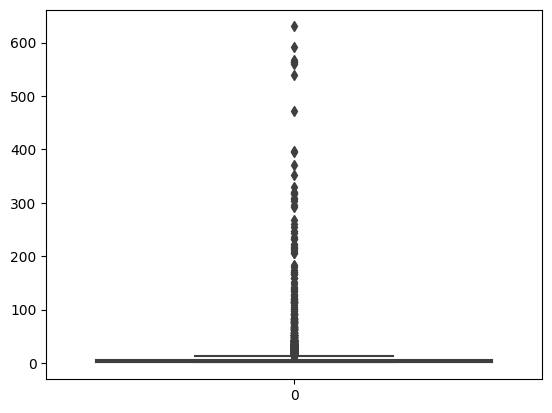

In [62]:
sns.boxplot(tmp_w)

In [63]:
# Mots uniques
list_unique_words_w = tmp_w[tmp_w == 1]
print(len(list_unique_words_w))
list_unique_words_w[:30]

1338


concepts        1
thigh           1
durga           1
jewellary       1
subject         1
stor            1
captures        1
rani            1
housewarming    1
lilac           1
trendz          1
lukluck         1
mb              1
temptation      1
sscp            1
elfani          1
flavoring       1
keyhanger       1
aurraa          1
flamingo        1
frequently      1
calories        1
eternity        1
drinking        1
buffet          1
keybox          1
delight         1
metalic         1
cfsl            1
rejuvenate      1
dtype: int64

In [64]:
# Mots 3 occurrences ou moins
list_max3_words_w = tmp_w[tmp_w <= 3]
print(len(list_max3_words_w))
list_max3_words_w[:30]

2733


gender             3
left               3
lemongrass         3
twisha             3
components         3
gseb               3
therapy            3
lenovo             3
charming           3
mosaic             3
opaque             3
export             3
waiting            3
lilliput           3
faux               3
myesquire          3
saba               3
foldable           3
multifunctional    3
obstacles          3
fashionable        3
sathiyas           3
recrafto           3
huppmegift         3
elite              3
vincent            3
coral              3
dynamic            3
vii                3
intex              3
dtype: int64

In [65]:
# Mots avec plus de 400 occurrences
list_more400_words_w = tmp_w[tmp_w >= 400]
print(len(list_more400_words_w))
list_more400_words_w

9


products       630
rs             592
delivery       567
shipping       564
cash           564
genuine        564
replacement    559
day            539
guarantee      471
dtype: int64

In [66]:
# Mots avec plus de 300 occurrences
list_more300words_w = tmp_w[tmp_w >= 300]
print(len(list_more300words_w))
list_more300words_w

20


products          630
rs                592
delivery          567
shipping          564
cash              564
genuine           564
replacement       559
day               539
guarantee         471
online            396
features          395
specifications    370
price             352
watch             330
baby              320
color             319
pack              317
material          309
set               307
type              303
dtype: int64

In [67]:
# Mots frequents
# la valeur 350 est choisie en fonction de la faible pertinence judgée
# des mots avec une frequence suppérieure
list_mostfrequent_words_w = tmp_w[tmp_w >= 350]
len(list_mostfrequent_words_w)

13

In [68]:
def unique_words_fct_w(list_words):
    # Nombre occurrences tokens
    tmp = pd.Series(list_words, dtype="object").value_counts()
    unique_words = tmp_w[tmp_w == 1]
    # Suppression mots rares
    non_rare_words = [w for w in list_words if w not in unique_words]
    return non_rare_words

In [69]:
def mfreq_words_fct_w(list_words, N):
    # Nombre occurrences tokens
    tmp = pd.Series(list_words, dtype="object").value_counts()
    mostfrequent_words = tmp_w[tmp_w >= N]
    # Suppression mots rares
    non_mfreq_words = [w for w in list_words if w not in mostfrequent_words]
    return non_mfreq_words

<span style='background:#e6792e'><span style='color:white'>wordpunct_tokenize</span></span>

In [70]:
# Mise en minuscules
raw_corpus = lower_case(raw_corpus)

# Exemple tokenization + nettoyage
tokens_corpus = wp_token(raw_corpus)

# Suppression mots de liaison
filtered_corpus = stop_word_filter_fct(tokens_corpus)

# Suppression de la ponctuation et les caractères non alphabétiques
filtered_alpha_corpus_wp = alpha_filter_fct(filtered_corpus)

test_corpus_tokens = ' '.join(filtered_alpha_corpus_wp)

In [71]:
display_tokens_info(filtered_alpha_corpus_wp)

nb tokens 45872, nb tokens uniques 4487
['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'rs', 'curtain', 'enhances', 'interiors', 'curtain', 'quality', 'polyester', 'fabric', 'features']


In [72]:
# Nombre occurrences token
tmp_wp = pd.Series(filtered_alpha_corpus_wp, dtype="object").value_counts()
tmp_wp

rs             911
products       631
delivery       567
genuine        564
shipping       564
              ... 
houseattire      1
nativity         1
onboard          1
burning          1
hijri            1
Length: 4487, dtype: int64

In [73]:
tmp_wp.describe()

count    4487.000000
mean       10.223312
std        39.010591
min         1.000000
25%         1.000000
50%         2.000000
75%         6.000000
max       911.000000
dtype: float64

<Axes: >

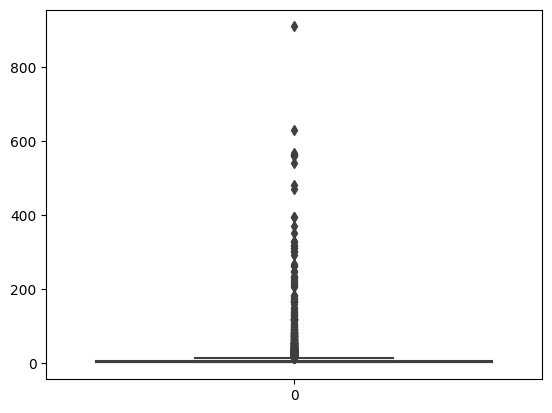

In [74]:
sns.boxplot(tmp_wp)

In [75]:
# Mots uniques
list_unique_words_wp = tmp_wp[tmp_wp == 1]
print(len(list_unique_words_wp))
list_unique_words_wp[:30]

1377


boiling        1
softly         1
elfani         1
delight        1
picnic         1
centric        1
define         1
knit           1
subfreezing    1
wrought        1
sugary         1
flavoured      1
travel         1
subject        1
keyhanger      1
takes          1
lollipop       1
enriched       1
drinks         1
gym            1
rejuvenate     1
management     1
iws            1
software       1
lukluck        1
frequently     1
categories     1
combined       1
habit          1
nagar          1
dtype: int64

In [76]:
# Mots 3 occurrences ou moins
list_max3_words_wp = tmp_wp[tmp_wp <= 3]
print(len(list_max3_words_wp))
list_max3_words_wp[:30]

2831


remote             3
intricate          3
vaccum             3
creamy             3
trim               3
multifunctional    3
waiting            3
positive           3
flow               3
chlorine           3
left               3
protector          3
frocks             3
kohl               3
newborns           3
exceptional        3
knife              3
shopmania          3
spandex            3
distance           3
lilliput           3
precise            3
absorbency         3
gender             3
starting           3
logo               3
letter             3
clip               3
dandruff           3
science            3
dtype: int64

In [77]:
# Mots avec plus de 400 occurrences
list_more400_words_wp = tmp_wp[tmp_wp >= 400]
print(len(list_more400_words_wp))
list_more400_words_wp

10


rs             911
products       631
delivery       567
genuine        564
shipping       564
cash           564
replacement    559
day            540
flipkart       481
guarantee      471
dtype: int64

In [78]:
# Mots avec plus de 300 occurrences
list_more300words_wp = tmp_wp[tmp_wp >= 300]
print(len(list_more300words_wp))
list_more300words_wp

21


rs                911
products          631
delivery          567
genuine           564
shipping          564
cash              564
replacement       559
day               540
flipkart          481
guarantee         471
online            396
features          395
specifications    371
price             352
watch             330
color             328
baby              320
pack              317
material          312
set               310
type              304
dtype: int64

In [79]:
# Mots frequents
# la valeur 350 est choisie en fonction de la faible pertinence judgée
# des mots avec une frequence suppérieure
list_mostfrequent_words_wp = tmp_wp[tmp_wp >= 350]
len(list_mostfrequent_words_wp)

14

In [80]:
def unique_words_fct_wp(list_words):
    # Nombre occurrences tokens
    tmp = pd.Series(list_words, dtype="object").value_counts()
    unique_words = tmp_wp[tmp_wp == 1]
    # Suppression mots rares
    non_rare_words = [w for w in list_words if w not in unique_words]
    return non_rare_words

In [81]:
def mfreq_words_fct_wp(list_words, N):
    # Nombre occurrences tokens
    tmp = pd.Series(list_words, dtype="object").value_counts()
    mostfrequent_words = tmp_wp[tmp_wp >= N]
    # Suppression mots rares
    non_mfreq_words = [w for w in list_words if w not in mostfrequent_words]
    return non_mfreq_words

### <font size="+2" color="#c0553d"><b>2.1.6. Suppression des mots avec moins de N charactères<b></font><br><a name="short_words"></a>


In [82]:
def short_word_filter_fct(list_words, min_len_word) :
    filtered_short_w = [w for w in list_words if len(w) >= min_len_word]
    return filtered_short_w

In [83]:
filtered_alpha_short_w = short_word_filter_fct(filtered_alpha_w, 3)

display_tokens_info(filtered_alpha_short_w)

nb tokens 143, nb tokens uniques 54
['memore', 'portable', 'flexible', 'led', 'light', 'lamp', 'usb', 'led', 'light', 'blue', 'price', 'brand', 'quality', 'perfect', 'fit', 'reading', 'light', 'weight', 'durable', 'cover', 'portable', 'multiple', 'choice', 'color', 'flexible', 'easy', 'clean', 'rated', 'voltage', 'rated']


In [84]:
filtered_alpha_short_wp = short_word_filter_fct(filtered_alpha_wp, 3)

display_tokens_info(filtered_alpha_short_wp)

nb tokens 149, nb tokens uniques 56
['memore', 'portable', 'flexible', 'led', 'light', 'lamp', 'mmull', 'skyblue', 'usb', 'led', 'light', 'blue', 'price', 'brand', 'quality', 'perfect', 'fit', 'reading', 'light', 'weight', 'durable', 'cover', 'portable', 'multiple', 'choice', 'color', 'flexible', 'easy', 'clean', 'rated']


### <font size="+2" color="#c0553d"><b>2.1.7. Stem and Lem<b></font><br><a name="stem_len"></a>

La **lemmatisation** désigne un traitement lexical apporté à un texte en vue de son classement dans un index ou de son analyse. Ce traitement consiste à appliquer aux occurrences des lexèmes sujets à flexion (en français, verbes, substantifs, adjectifs) un codage renvoyant à leur entrée lexicale commune (« forme canonique » enregistrée dans les dictionnaires de la langue, le plus couramment), que l'on désigne sous le terme de lemme.<br> 
Le **Stemming** (ou **Racinisation**) est un procédé de transformation des flexions en leur radical ou racine. La racine d’un mot correspond à la partie du mot restante une fois que l’on a supprimé son (ses) préfixe(s) et suffixe(s), à savoir son radical. Contrairement au lemme qui correspond à un terme issu de l’usage ordinaire des locuteurs de la langue, la racine ne correspond généralement qu’à un terme résultant de ce type d’analyse.

In [85]:
# Stemmer (expresssion minimale d'un mot)
def stem_fct(list_words) :
    setmmer = PorterStemmer()
    stem_w = [setmmer.stem(w) for w in list_words]
    return stem_w

In [86]:
# racinisation des mots
filtered_alpha_short_stem_w = stem_fct(filtered_alpha_short_w)

print(set(filtered_alpha_short_stem_w))
print(len(set(filtered_alpha_short_stem_w)))

{'rate', 'blue', 'manufactur', 'requir', 'flexibl', 'warranti', 'light', 'recharg', 'sale', 'model', 'weight', 'materi', 'adjust', 'inbuilt', 'depth', 'port', 'ultra', 'height', 'batteri', 'packag', 'multipl', 'lamp', 'consumpt', 'type', 'clean', 'qualiti', 'bright', 'design', 'voltag', 'silicon', 'uniqu', 'perfect', 'cover', 'bendabl', 'brand', 'read', 'usb', 'led', 'color', 'siliconememor', 'easi', 'key', 'price', 'portabl', 'choic', 'devic', 'memor', 'fit', 'size', 'durabl', 'power'}
51


In [87]:
# racinisation des mots
filtered_alpha_short_stem_wp = stem_fct(filtered_alpha_short_wp)

print(set(filtered_alpha_short_stem_wp))
print(len(set(filtered_alpha_short_stem_wp)))

{'rate', 'blue', 'manufactur', 'requir', 'flexibl', 'warranti', 'light', 'recharg', 'sale', 'model', 'weight', 'skyblu', 'materi', 'mmull', 'adjust', 'inbuilt', 'depth', 'port', 'ultra', 'height', 'batteri', 'packag', 'multipl', 'lamp', 'consumpt', 'type', 'clean', 'qualiti', 'bright', 'design', 'voltag', 'silicon', 'uniqu', 'perfect', 'cover', 'bendabl', 'brand', 'read', 'usb', 'led', 'color', 'siliconememor', 'easi', 'key', 'price', 'portabl', 'choic', 'devic', 'memor', 'fit', 'size', 'durabl', 'power'}
53


In [88]:
# Lemmatizer (base d'un mot)
def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

In [89]:
# Lemmatisation des mots
filtered_alpha_short_lem_w = lemma_fct(filtered_alpha_short_w)

print(set(filtered_alpha_short_lem_w))
print(len(set(filtered_alpha_short_lem_w)))

{'voltage', 'blue', 'quality', 'memore', 'light', 'rated', 'unique', 'sale', 'model', 'weight', 'silicone', 'bendable', 'manufacturer', 'inbuilt', 'depth', 'port', 'ultra', 'height', 'lamp', 'reading', 'type', 'battery', 'portable', 'clean', 'easy', 'bright', 'design', 'adjustment', 'silicon', 'durable', 'requirement', 'perfect', 'cover', 'brand', 'siliconememore', 'usb', 'led', 'powered', 'color', 'consumption', 'package', 'rechargeable', 'key', 'price', 'device', 'covered', 'choice', 'warranty', 'fit', 'flexible', 'multiple', 'size', 'material', 'power'}
54


In [90]:
# Lemmatisation des mots
filtered_alpha_short_lem_wp = lemma_fct(filtered_alpha_short_wp)

print(set(filtered_alpha_short_lem_wp))
print(len(set(filtered_alpha_short_lem_wp)))

{'voltage', 'blue', 'quality', 'memore', 'light', 'rated', 'unique', 'sale', 'model', 'weight', 'silicone', 'mmull', 'bendable', 'manufacturer', 'inbuilt', 'depth', 'port', 'ultra', 'height', 'lamp', 'reading', 'type', 'battery', 'portable', 'clean', 'easy', 'bright', 'design', 'adjustment', 'silicon', 'durable', 'requirement', 'perfect', 'cover', 'brand', 'siliconememore', 'usb', 'led', 'powered', 'color', 'consumption', 'package', 'rechargeable', 'key', 'price', 'device', 'covered', 'choice', 'warranty', 'fit', 'flexible', 'multiple', 'size', 'material', 'power', 'skyblue'}
56


Comme le montrent les exemples précédents, les résultats du stemmer et du lemmatizer ne sont pas très différents.
Cela correspond aux informations recueillies lors d'une recherche sur l'efficacité des deux méthodes.
Il existe un consensus sur le fait que :
* le **stemming** est plus rapide à mettre en œuvre et assez simple. Mais il peut y avoir quelques imprécisions, qui peuvent ne pas être pertinentes pour des tâches et des opérations particulières.
* la **lemmatisation**, quant à elle, fournit de meilleurs résultats en analysant le POS (de l'anglais, *part of speech*) des mots et en affichant ainsi des mots réels. La lemmatisation est plus difficile à mettre en œuvre et un peu plus lente que le stemming.

En résumé, la lemmatisation est considerée comme le meilleur choix pour la recherche des résultats qualitatifs.
On utilisera la **lemmatisation pour la suite de l'étude**.

---
---

En même temps les analyses utilisant **wordpunct_tokenize** resultent en un nombre plus elevé de tokens. On utilisera le tokenizer **word_tokenize** pour la suite de l'étude.

### <font size="+2" color="#c0553d"><b>2.1.8. Mots communes à toutes les catégories<b></font><br><a name="mots_communes_toutes_categories"></a>


**Pre-analyse catégories**


In [91]:
df_text_analysis["Categ_N0"].sort_values().unique()

array(['Baby Care', 'Beauty and Personal Care', 'Computers',
       'Home Decor & Festive Needs', 'Home Furnishing',
       'Kitchen & Dining', 'Watches'], dtype=object)

In [92]:
# Créer un df par catégorie

df_babyCare = df_text_analysis[df_text_analysis["Categ_N0"] == "Baby Care"]
df_beauty = df_text_analysis[df_text_analysis["Categ_N0"] ==
                             "Beauty and Personal Care"]
df_computers = df_text_analysis[df_text_analysis["Categ_N0"] == "Computers"]
df_decor = df_text_analysis[df_text_analysis["Categ_N0"] ==
                            "Home Decor & Festive Needs"]
df_home = df_text_analysis[df_text_analysis["Categ_N0"] == "Home Furnishing"]
df_kitchen = df_text_analysis[df_text_analysis["Categ_N0"] ==
                              "Kitchen & Dining"]
df_watches = df_text_analysis[df_text_analysis["Categ_N0"] == "Watches"]

In [93]:
# Corpus par catégorie

corpus_babyCare = " ".join(df_babyCare.description).lower()
corpus_beauty = " ".join(df_beauty.description).lower()
corpus_computers = " ".join(df_computers.description).lower()
corpus_decor = " ".join(df_decor.description).lower()
corpus_home = " ".join(df_home.description).lower()
corpus_kitchen = " ".join(df_kitchen.description).lower()
corpus_watches = " ".join(df_watches.description).lower()

In [94]:
# Préparation du texte
def test_transform_fct(text, min_len_word, N) :
    lw_text = text.lower().strip()
    w_tokens = w_token(lw_text)
    filtered_w = stop_word_filter_fct(w_tokens)
    filtered_alpha_w = alpha_filter_fct(filtered_w)
    filtered_short_w = short_word_filter_fct(filtered_alpha_w, min_len_word)
    non_rare_words = unique_words_fct_w(filtered_short_w)
    non_mfreq_words = mfreq_words_fct_w(non_rare_words, N)
    #engl_text = engL_words_fct(non_mfreq_words)
    return non_mfreq_words

In [95]:
corpus_babyCare = test_transform_fct(corpus_babyCare, 3, 350)

corpus_beauty = test_transform_fct(corpus_beauty, 3, 350)

corpus_computers = test_transform_fct(corpus_computers, 3, 350)

corpus_decor = test_transform_fct(corpus_decor, 3, 350)

corpus_home = test_transform_fct(corpus_home, 3, 350)

corpus_kitchen = test_transform_fct(corpus_kitchen, 3, 350)

corpus_watches = test_transform_fct(corpus_watches, 3, 350)

In [96]:
# Mots presents dans toutes les catégories

doublons = [i for i in pd.Series(corpus_babyCare, dtype="object")
                                               .value_counts().index
            if i in pd.Series(corpus_beauty, dtype="object")\
                                               .value_counts().index
            if i in pd.Series(corpus_computers, dtype="object")\
                                               .value_counts().index
            if i in pd.Series(corpus_decor, dtype="object")\
                                               .value_counts().index
            if i in pd.Series(corpus_home, dtype="object")\
                                               .value_counts().index
            if i in pd.Series(corpus_kitchen, dtype="object")\
                                               .value_counts().index
            if i in pd.Series(corpus_watches, dtype="object")\
                                               .value_counts().index]
doublons

['ideal',
 'package',
 'sales',
 'type',
 'pack',
 'contents',
 'box',
 'key',
 'color',
 'blue',
 'brand',
 'dimensions',
 'size',
 'material',
 'style',
 'product',
 'pink',
 'suitable',
 'design',
 'green',
 'water',
 'cover',
 'quality',
 'red',
 'weight',
 'white',
 'black',
 'height',
 'light',
 'vary',
 'body',
 'india',
 'designed',
 'add',
 'touch',
 'life']

In [97]:
def doubl_word_filter_fct(text, list_doublons):
    # Suppression des mots communs à toutes les catégories
    non_doub_tokens = [w for w in text if w not in list_doublons]
    return non_doub_tokens

## <font size="+2" color="#903b3f"><b>2.2. Fonctions de nettoyage</b></font><br><a name="fonctions_nettoyage"></a>

In [98]:
# Fonction de préparation du texte pour le bag of words
# (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(text, list_doublons, min_len_word, N, rejoin=False) :
    text_lw = lower_case(text)
    w_tokens = w_token(text_lw)
    filtered_w = stop_word_filter_fct(w_tokens)
    filtered_alpha_w = alpha_filter_fct(filtered_w)
    non_rare_words = unique_words_fct(filtered_alpha_w)
    #non_mfreq_words = mfreq_words_fct(non_rare_words, N)
    filtered_short_w = short_word_filter_fct_w(non_rare_words, min_len_word)
    # lem_w = lemma_fct(filtered_short_w)
    # engl_text = eng_words_fct(filtered_short_w)
    # engl_textL = engL_words_fct(non_mfreq_words)
    non_doub_tokens = doubl_word_filter_fct(filtered_short_w, list_doublons)

    if rejoin :
        return " ".join(filtered_short_w)
    return filtered_short_w

# Fonction pour implementation en parallel
def prll_transform_bow_fct(text) :
    """execute le nettoyage du corpus"""
    new_text = transform_bow_fct(text, doublons, 3, 350, rejoin=True)
    return new_text

In [99]:
# Fonction de préparation du texte pour le bag of words
# (Countvectorizer et Tf_idf, Word2Vec)
# avec racinisazion
def transform_bow_lem_fct(text, list_doublons,
                          min_len_word, N, rejoin=False) :
    """
    @ Paramètres
    * text : texte à traiter
    * N : int, nombre maximal d'ocurrences des mots à retenir
    * list_doublons : list, liste des mots présents dans toutes les
                    catégories, considérés comme doublons, à supprimer
    """
    text_lw = lower_case(text)
    w_tokens = w_token(text_lw)
    filtered_w = stop_word_filter_fct(w_tokens)
    filtered_alpha_w = alpha_filter_fct(filtered_w)
    non_rare_words = unique_words_fct_w(filtered_alpha_w)
    #non_mfreq_words = mfreq_words_fct(non_rare_words, N)
    filtered_short_w = short_word_filter_fct(non_rare_words, min_len_word)
    lem_w = lemma_fct(filtered_short_w)
    # engl_textL = engL_words_fct(non_mfreq_words)
    non_doub_tokens = doubl_word_filter_fct(lem_w, list_doublons)

    if rejoin :
        return " ".join(non_doub_tokens)
    return non_doub_tokens

# Fonction pour implementation en parallel
def prll_transform_bow_lem_fct(text) :
    """execute le nettoyage du corpus"""
    new_text = transform_bow_stem_fct(text, doublons, 3, 350, rejoin=True)
    return new_text

In [100]:
# Fonction de préparation du texte pour Deep learning (USE et BERT)
def transform_dl_fct(text, rejoin=False) :
    """
    @ Paramètres
    * text : texte à traiter
    * N : int, nombre maximal d'ocurrences des mots à retenir
    * list_doublons : list, liste des mots présents dans toutes les
                    catégories, considérés comme doublons, à supprimer
    """
    text_lw = lower_case(text)
    w_tokens = w_token(text_lw)
    # filtered_w = stop_word_filter_fct(w_tokens)
    filtered_alpha_w = alpha_filter_fct(w_tokens)
    # non_rare_words = unique_words_fct_w(filtered_alpha_w)
    # non_mfreq_words = mfreq_words_fct(non_rare_words, N)
    # filtered_short_w = short_word_filter_fct_w(non_mfreq_words, min_len_word)
    # lem_w = lemma_fct(filtered_short_w)
    # engl_textL = engL_words_fct(lem_w)
    # non_doub_tokens = doubl_word_filter_fct(engl_textL, list_doublons)
    if rejoin :
        return " ".join(filtered_alpha_w)
    return filtered_alpha_w

# Fonction pour implementation en parallel
def prll_transform_dl_fct(text) :
    """execute le nettoyage du corpus"""
    new_text = transform_dl_fct(text, rejoin=True)
    return new_text

### <font size="+2" color="#c0553d"><b>2.2.1. Bag of words<b></font><br><a name="bag_tokens"></a>


In [101]:
# réunir tous les corpus
raw_corpus = " ".join(df_text_analysis["description"].values)

In [102]:
# Test "Lemmatization"
# Application fonction tokenisation et nettoyage
corpus_lem = transform_bow_lem_fct(raw_corpus, doublons, 3, 350)
display_tokens_info(corpus_lem)

nb tokens 36011, nb tokens uniques 2733
['feature', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'price', 'curtain', 'enhances', 'curtain', 'polyester', 'feature', 'eyelet', 'stitch', 'metal', 'environment', 'curtain', 'wrinkle', 'anti']


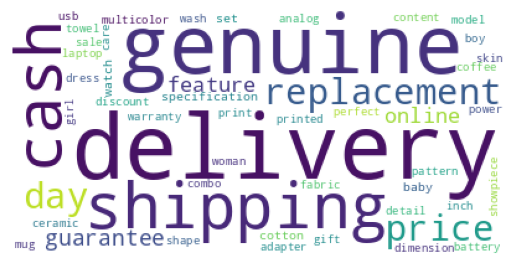

In [103]:
wrdcloud_lem = WordCloud(background_color="white", stopwords=[], max_words=50,
                      collocations=False).generate(" ".join(corpus_lem))
plt.imshow(wrdcloud_lem)
plt.axis("off")
plt.show()

Home Furnishing


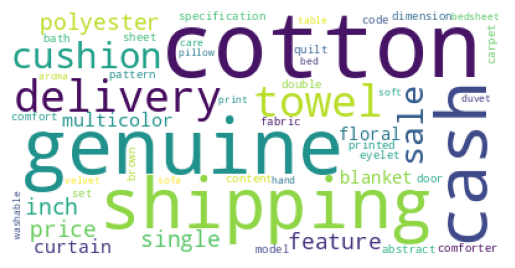


Baby Care


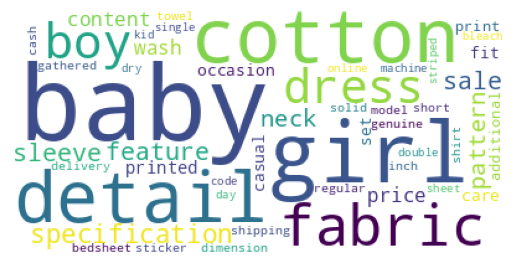


Watches


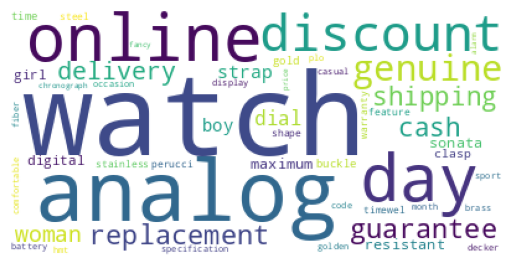


Home Decor & Festive Needs


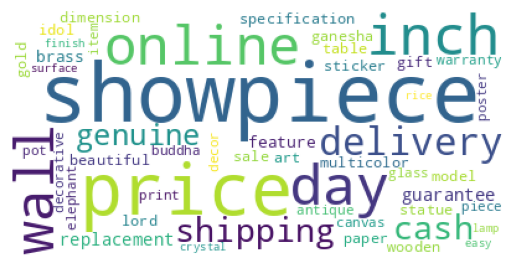


Kitchen & Dining


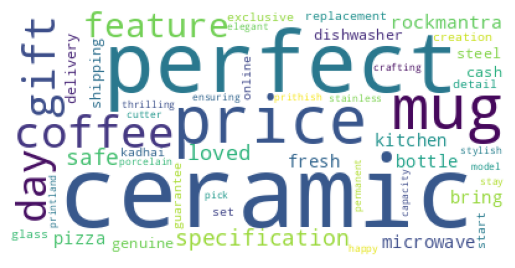


Beauty and Personal Care


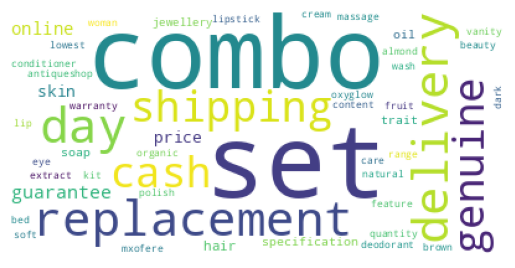


Computers


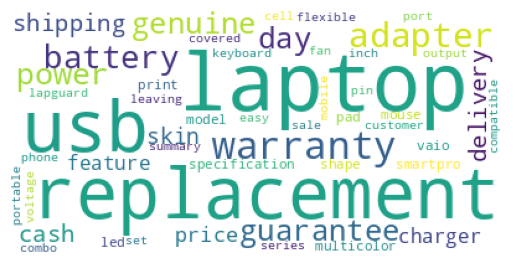

In [104]:
# Nettoyage du texte par catégorie, ex. lemmatisation
n = 30
list_freq_tokens = []
summary_cat = pd.DataFrame()

for cat in df_text_analysis["Categ_N0"].unique():
    print(cat)
    mask = df_text_analysis["Categ_N0"] == cat

    raw_corpus = " ".join(df_text_analysis.loc[mask, "description"].values)

    corpus = transform_bow_lem_fct(raw_corpus, doublons, 3, 350)

    summary_cat[cat] = pd.Series(corpus, dtype="object").value_counts()\
                                                            .head(n).index
    list_freq_tokens.extend(list(pd.Series(corpus, dtype="object")
                                 .value_counts().head(n).index))

    wordcloud = WordCloud(background_color="white", stopwords=[],
                          max_words=50, collocations=False)\
                          .generate(" ".join(corpus))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    print()

In [105]:
# Ex. lemmatization
summary_cat

,Home Furnishing,Baby Care,Watches,Home Decor & Festive Needs,Kitchen & Dining,Beauty and Personal Care,Computers
0,cotton,baby,watch,showpiece,ceramic,set,laptop
1,genuine,girl,analog,price,perfect,combo,replacement
2,shipping,cotton,day,day,price,replacement,usb
3,cash,detail,shipping,inch,mug,delivery,warranty
4,delivery,fabric,delivery,online,coffee,day,adapter
5,towel,boy,online,delivery,gift,shipping,battery
6,cushion,dress,discount,wall,day,cash,power
7,sale,specification,genuine,guarantee,feature,genuine,guarantee
8,polyester,feature,cash,shipping,specification,guarantee,day
9,inch,sleeve,replacement,genuine,safe,online,genuine


In [106]:
# Ex. lemmatization
# Verifier si les mot communs à toutes les catégories ont été supprimmés
freq_words = pd.Series(list_freq_tokens, dtype="object").value_counts()
freq_words = freq_words[freq_words >= 3]
freq_words

feature          6
shipping         6
cash             6
delivery         6
genuine          6
specification    6
price            6
day              5
replacement      5
guarantee        5
online           4
model            4
warranty         3
sale             3
inch             3
dimension        3
set              3
multicolor       3
dtype: int64

In [107]:
# Les tokens presents en 3 ou plus catégories sont judgés
# non pertinents pour la classification, ils sont donc supprimmés
freq_tokens = freq_words.index.tolist()


def freq_categ_filter_fct(text, list_mots_plusieurs_categ):
    # Suppression des mots communs à plusieurs catégories
    non_freq_tokens = [w for w in text if w not in list_mots_plusieurs_categ]
    return non_freq_tokens

In [108]:
# Fonction de préparation du texte pour le bag of words
# (Countvectorizer et Tf_idf, Word2Vec)
# avec lemmatization
def transf_bow_lem_fct(text, N, list_doublons,
                       min_len_word,
                       list_mots_plusieurs_categ,
                       rejoin=False):
    """
    @ Paramètres
    * text : texte à traiter
    * N : int, nombre maximal d'ocurrences des mots à retenir
    * list_doublons : list, liste des mots présents dans toutes les
                    catégories, considérés comme doublons, à supprimer
    """
    text_lw = lower_case(text)
    w_tokens = w_token(text_lw)
    filtered_w = stop_word_filter_fct(w_tokens)
    filtered_alpha_w = alpha_filter_fct(filtered_w)
    non_rare_words = unique_words_fct_w(filtered_alpha_w)
    # non_mfreq_words = mfreq_words_fct(non_rare_words, N)
    # non_doub_tokens = doubl_word_filter_fct(non_mfreq_words, list_doublons)
    filtered_short_w = short_word_filter_fct(non_rare_words, min_len_word)
    # stem_w = stem_fct(filtered_short_w)
    lem_w = lemma_fct(filtered_short_w)
    # engl_text = eng_words_fct(non_mfreq_words)
    # engl_textS = engS_words_fct(non_mfreq_words)
    # engl_textL = engL_words_fct(non_mfreq_words)
    non_freq_tokens = freq_categ_filter_fct(lem_w,
                                            list_mots_plusieurs_categ)

    if rejoin :
        return " ".join(non_freq_tokens)
    return non_freq_tokens

# Fonction pour implementation en parallel
def prll_transf_bow_lem_fct(text) :
    """execute le nettoyage du corpus"""
    new_text = transf_bow_lem_fct(text, N=350, list_doublons=doublons,
                                  min_len_word=3,
                                  list_mots_plusieurs_categ=freq_tokens,
                                  rejoin=True)
    return new_text

### <font size="+2" color="#c0553d"><b>2.2.2. Nettoyage texte<b></font><br><a name="nettoyage_text"></a>

In [109]:
os.environ["TOKENIZERS_PARALLELISM"] = "true"
# Bag of words avec lemmatization
df_text_analysis["text_bow_lem"] = df_text_analysis["description"]\
                   .parallel_apply(lambda x: prll_transf_bow_lem_fct(x))

In [110]:
# Deep Learning
df_text_analysis["text_dl"] = df_text_analysis["description"]\
                        .parallel_apply(lambda x: prll_transform_dl_fct(x))

In [111]:
df_text_analysis[["Categ_N0", "description", "text_bow_lem", "text_dl"]]

,Categ_N0,description,text_bow_lem,text_dl
0,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,key elegance polyester abstract eyelet door cu...,key features of elegance polyester multicolor ...
1,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel bath towel red yell...,specifications of sathiyas cotton bath towel b...
2,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,key eurospa cotton terry towel size height gsm...,key features of eurospa cotton terry face towe...
3,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,key santosh royal fashion cotton printed king ...,key features of santosh royal fashion cotton p...
4,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,key jaipur print cotton floral king sized doub...,key features of jaipur print cotton floral kin...
...,...,...,...,...
1045,Baby Care,Oren Empower Extra Large Self Adhesive Sticker...,empower extra adhesive sticker pack double sti...,oren empower extra large self adhesive sticker...
1046,Baby Care,Wallmantra Large Vinyl Sticker Sticker (Pack o...,wallmantra vinyl sticker sticker pack bring ex...,wallmantra large vinyl sticker sticker pack of...
1047,Baby Care,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,uberlyfe extra pigmented polyvinyl film import...,buy uberlyfe extra large pigmented polyvinyl f...
1048,Baby Care,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,wallmantra medium vinyl sticker sticker wallma...,buy wallmantra medium vinyl sticker sticker fo...


### <font size="+2" color="#c0553d"><b>2.2.3. Préparation commune<b></font><br><a name="prep_commune"></a>

In [112]:
l_cat = list(set(df_text_analysis["Categ_N0"]))
print("catégories : ", l_cat)
y_cat_num = [(1-l_cat.index(df_text_analysis.iloc[i]['Categ_N0']))
               for i in range(len(df_text_analysis))]

catégories :  ['Computers', 'Baby Care', 'Watches', 'Kitchen & Dining', 'Home Decor & Festive Needs', 'Home Furnishing', 'Beauty and Personal Care']


In [113]:
df_text_analysis["lenght_bow_lem"] = df_text_analysis["text_bow_lem"]\
                                        .apply(lambda x: len(x.split(' ')))
print("max length bow lemmatizer : ",
      df_text_analysis["lenght_bow_lem"].max())

df_text_analysis["lenght_bow_dl"] = df_text_analysis["text_dl"]\
                                        .apply(lambda x: len(x.split(' ')))
print("max length dl : ", df_text_analysis["lenght_bow_dl"].max())

max length bow lemmatizer :  250
max length dl :  559


In [114]:
df_text_analysis["uniq_tokens_lem"] = df_text_analysis["text_bow_lem"]\
                                        .apply(lambda x: len(x.split(' ')))
print("Nombre tokens uniques bow lemmatizer : ",
      df_text_analysis["lenght_bow_lem"].unique().sum())

df_text_analysis["uniq_tokens_dl"] = df_text_analysis["text_dl"]\
                                        .apply(lambda x: len(x.split(' ')))
print("Nombre tokens uniques dl : ",
      df_text_analysis["lenght_bow_dl"].unique().sum())

Nombre tokens uniques bow lemmatizer :  9546
Nombre tokens uniques dl :  29007


## <font size="+2" color="#903b3f"><b>2.3. Extraction des features et analyse</b></font><br><a name="feature_extraction_analysis"></a>


### <font size="+2" color="#c0553d"><b>2.3.1. Comptage simple des mots, CountVectorizer<b></font><br><a name="comptage_mots_simple"></a>

In [115]:
# Variable dont on veut extraire les features
bow_lem_descr_clean = df_text_analysis["text_bow_lem"]

In [116]:
# Instanciation
ctvczr = CountVectorizer(max_df=0.90, min_df=2, max_features=300)

# Tokenisation et création du vocabulaire
ctvczr.fit(bow_lem_descr_clean)
# Résumé du vocabulaire
# print(ctvczr.get_feature_names()[0:10])
# print(ctvczr.vocabulary_)

# Encodage/Vectorisation
vector_cv = ctvczr.transform(bow_lem_descr_clean)
# Résumé de la vectorisation
print(vector_cv.shape)
# print(type(vector_desc_lem_vectorizer))

# Dataframe pour réduction de dimension
X_vector_cv = vector_cv.toarray()
df_countvec = pd.DataFrame(X_vector_cv)

(1050, 300)


#### <font size="+1" color="#e6792e"><b>Clusters - ACP - CountVectorizer</b></font><br><a name="kmeans_acp_cv"></a>

**Recherche des meilleurs hyperparamètres pour ACP**

In [117]:
# Analyse en composante principale
liste_tuples_comp = [(0, 1)]
reduire_dimension_acp(df_countvec, 300)

'Nombre de composantes expliquant 90% de la variance : 91'

'Nombre de composantes expliquant 99% de la variance : 197'

In [118]:
# ACP avec 197 composantes expliquants 99% de la variance
n_comp = 197
pca_cv = decomposition.PCA(n_components=n_comp, random_state=seed)
pca_cv.fit(df_countvec)
X_proj_acp_cv = pca_cv.transform(df_countvec)

**Recherche des meilleurs hyperparamètres k-means**

In [119]:
type_donnee = "ACP_CV_DESCR"

In [120]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_proj_acp_cv[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
ACP_CV_DESCR,10,500,0.719963,65.562604,0.394309,0.029469
ACP_CV_DESCR,20,500,0.719963,65.562604,0.394309,0.047458
ACP_CV_DESCR,20,200,0.719963,65.562604,0.394309,0.047606
ACP_CV_DESCR,20,300,0.719963,65.562604,0.394309,0.049484
ACP_CV_DESCR,20,100,0.719963,65.562604,0.394309,0.050784
ACP_CV_DESCR,20,400,0.719963,65.562604,0.394309,0.053019
ACP_CV_DESCR,30,400,0.719963,65.562604,0.394309,0.069255
ACP_CV_DESCR,30,300,0.719963,65.562604,0.394309,0.070237
ACP_CV_DESCR,30,100,0.719963,65.562604,0.394309,0.070348
ACP_CV_DESCR,30,200,0.719963,65.562604,0.394309,0.077653


**Calcul ARI et projection ACP**

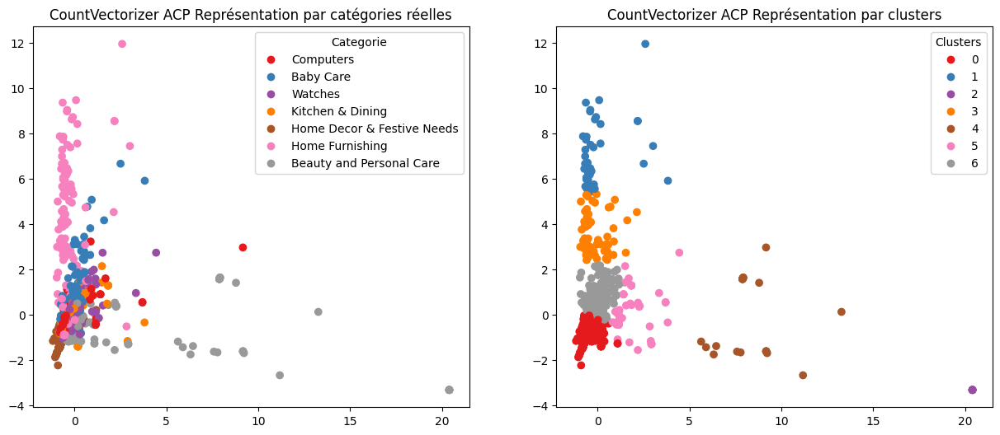

ARI :  0.0387


In [121]:
df_acp_cv = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection ACP
ARI, kmeans_acp_labels, df_acp_cv, df_compar_method = \
                                    ARI_fct(X_proj=X_proj_acp_cv,
                                            Method="CountVectorizer_ACP",
                                            init_method="k-means++",
                                            Ninit=10, m_iter=500,
                                            df_donnees=df_text_analysis,
                                            df_analyse=df_acp_cv,
                                            df_comparatif=df_compar_method)

dimReduc_visu_fct(X_proj_acp_cv, y_cat_num, kmeans_acp_labels,
                  ARI, "CountVectorizer ACP ")

#### <font size="+1" color="#e6792e"><b>Clusters - t-SNE - CountVectorizer</b></font><br><a name="kmeans_tsne_cv"></a>

**Recherche des meilleurs hyperparamètres pour t-SNE**

In [122]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results_cv = list()
tsne_results_cv = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_cv = tsne.fit_transform(df_countvec)
    results_cv.append(tsne_results_cv)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.004s...
[t-SNE] Computed neighbors for 1050 samples in 0.062s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.971252
[t-SNE] KL divergence after 500 iterations: 0.599058
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.054s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.150719
[t-SNE] KL divergence after 500 iterations: 0.626959
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.0

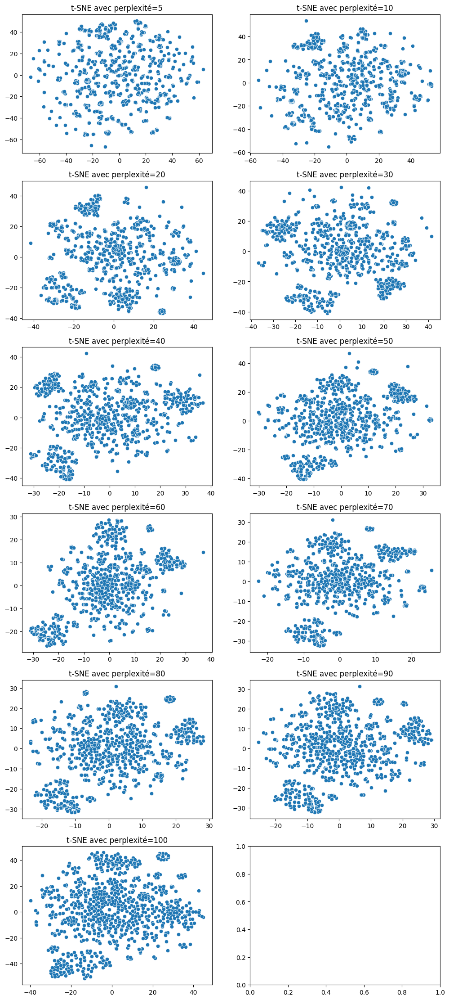

In [123]:
affiche_tsne(results_cv, liste_param, 1)

* groupes plus homogènes pour **perplexité=30**
* on laissera les paramètres learning_rate et n_iter par défaut (1000) et le nombre de composants par défaut (2)

In [124]:
# Réduction de dimension tsne
tsne_cv = TSNE(verbose=1, perplexity=70)
X_proj_tsne_cv = tsne_cv.fit_transform(df_countvec)

[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.211s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 1.167674
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.637627
[t-SNE] KL divergence after 1000 iterations: 0.607265


**Recherche des meilleurs hyperparamètres k-means**

In [125]:
type_donnee = "tSNE_CV_DESCR"

In [126]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_proj_tsne_cv[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
tSNE_CV_DESCR,50,500,0.552843,6452.939453,0.493251,0.168238
tSNE_CV_DESCR,50,300,0.552843,6452.939453,0.493251,0.168722
tSNE_CV_DESCR,50,200,0.552843,6452.939453,0.493251,0.172222
tSNE_CV_DESCR,50,100,0.552843,6452.939453,0.493251,0.187567
tSNE_CV_DESCR,50,400,0.552843,6452.939453,0.493251,0.192984
tSNE_CV_DESCR,70,100,0.552843,6452.939453,0.493251,0.223826
tSNE_CV_DESCR,70,400,0.552843,6452.939453,0.493251,0.231868
tSNE_CV_DESCR,70,500,0.552843,6452.939453,0.493251,0.235777
tSNE_CV_DESCR,70,200,0.552843,6452.939453,0.493251,0.257071
tSNE_CV_DESCR,80,400,0.552843,6452.939453,0.493251,0.261704


**Calcul ARI et projection t-SNE**

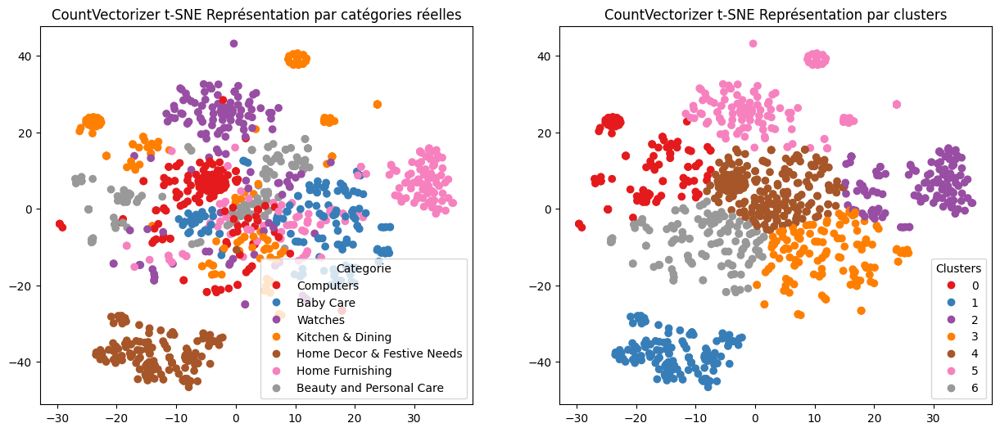

ARI :  0.3252


In [127]:
df_tsne_cv = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection t-SNE
ARI, labels, df_tsne_cv, df_compar_method = ARI_fct(X_proj=X_proj_tsne_cv,
                                            Method="CountVectorizer_t-SNE",
                                                    init_method="k-means++",
                                                    Ninit=10, m_iter=500,
                                            df_donnees=df_text_analysis,
                                                    df_analyse=df_tsne_cv,
                                            df_comparatif=df_compar_method)

dimReduc_visu_fct(X_proj_tsne_cv, y_cat_num, labels, ARI,
                  "CountVectorizer t-SNE ")

#### <font size="+1" color="#e6792e"><b>Clusters - ACP+t-SNE - CountVectorizer</b></font><br><a name="kmeans_ACP_tsne_cv"></a>

**Recherche des meilleurs hyperparamètres pour t-SNE avec initialisation PCA**

In [128]:
# t-SNE tuning du paramètre perplexity avec initialisation PCA
top_depart = time.time()
liste_param = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results_cv = list()
acptsne_results_cv = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    acptsne_results_cv = tsne.fit_transform(X_proj_acp_cv)
    results_cv.append(acptsne_results_cv)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.046s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.281448
[t-SNE] KL divergence after 500 iterations: 0.626411
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.030s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.659485
[t-SNE] KL divergence after 500 iterations: 0.604451
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.0

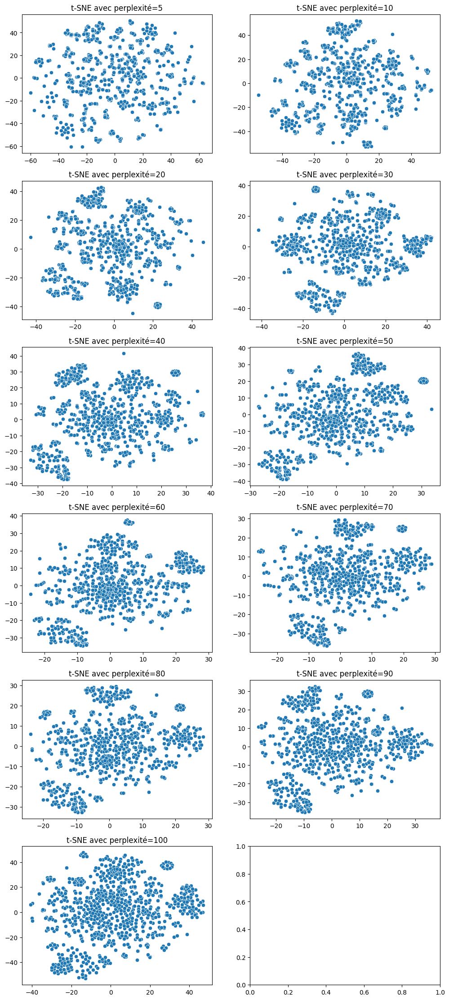

In [129]:
# Visualisation en 2D des différents résultats selon la perplexité
affiche_tsne(results_cv, liste_param, 1)

- groupes plus homogènes pour perplexité=30
- on laissera les paramètres learning_rate et n_iter par défaut (1000) et le nombre de composants par défaut (2).

In [130]:
# Réduction de dimension tsne
acptsne_cv = TSNE(verbose=1, perplexity=40)
X_proj_acptsne_cv = acptsne_cv.fit_transform(X_proj_acp_cv)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.088s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.274605
[t-SNE] KL divergence after 1000 iterations: 0.446489


**Recherche des meilleurs hyperparamètres k-means**

In [131]:
type_donnee = "PCA-tSNE_CV_DESCR"

In [132]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_proj_acptsne_cv[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
PCA-tSNE_CV_DESCR,10,400,0.562187,32342.576172,0.493668,0.032609
PCA-tSNE_CV_DESCR,10,200,0.562187,32342.576172,0.493668,0.040357
PCA-tSNE_CV_DESCR,10,500,0.562187,32342.576172,0.493668,0.040959
PCA-tSNE_CV_DESCR,10,300,0.562187,32342.576172,0.493668,0.045128
PCA-tSNE_CV_DESCR,20,100,0.562187,32342.576172,0.493668,0.065014
PCA-tSNE_CV_DESCR,20,300,0.562187,32342.576172,0.493668,0.073147
PCA-tSNE_CV_DESCR,20,400,0.562187,32342.576172,0.493668,0.074722
PCA-tSNE_CV_DESCR,20,500,0.562187,32342.576172,0.493668,0.075041
PCA-tSNE_CV_DESCR,30,100,0.562187,32342.576172,0.493668,0.094824
PCA-tSNE_CV_DESCR,30,400,0.562187,32342.576172,0.493668,0.095191


**Calcul ARI et projection t-SNE avec initialization ACP**

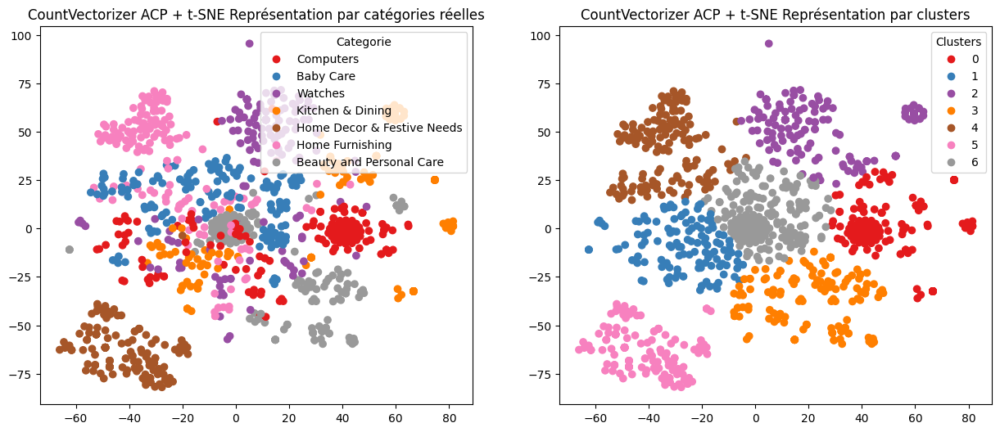

ARI :  0.3901


In [133]:
df_acptsne_cv = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection t-SNE
ARI, labels, df_acptsne_cv, df_compar_method = \
                                    ARI_fct(X_proj=X_proj_acptsne_cv,
                                            Method="CountVectorizer_ACP_tSNE",
                                            init_method="k-means++",
                                            Ninit=10, m_iter=300,
                                            df_donnees=df_text_analysis,
                                            df_analyse=df_acptsne_cv,
                                            df_comparatif=df_compar_method)

dimReduc_visu_fct(X_proj_acptsne_cv, y_cat_num, labels,
                  ARI, "CountVectorizer ACP + t-SNE ")

### <font size="+2" color="#c0553d"><b>2.3.2. Tt-idf<b></font><br><a name="tfidf"></a>

In [134]:
# Instanciation
tfidfvectorizer = TfidfVectorizer(max_df=0.90, min_df=2, max_features=300)
# Tokenisation et création du vocabulaire
tfidfvectorizer.fit(bow_lem_descr_clean)

# Encodage/Vectorisation
vector_tfidfvectorizer = tfidfvectorizer.transform(bow_lem_descr_clean)

# Résumé de la vectorisation
print(vector_tfidfvectorizer.shape)

# Dataframe pour réduction de dimension
X_vector_tfidf = vector_tfidfvectorizer.toarray()
df_tfidfvec = pd.DataFrame(X_vector_tfidf)

(1050, 300)


In [135]:
# Matrice BOW de tfIdfVectorizer
df_bow_tfidf_vect = pd.DataFrame(vector_tfidfvectorizer.todense(),
                            columns=tfidfvectorizer.get_feature_names_out())
df_bow_tfidf_vect["Categorie"] = df_text_analysis["Categ_N0"]
print(df_bow_tfidf_vect.shape)
# df_bow_tfidf_vect_descr

(1050, 301)


#### <font size="+1" color="#e6792e"><b>Clusters - ACP - TfidfVectorizer</b></font><br><a name="kmeans_acp_tfidf"></a>

**Recherche des meilleurs hyperparamètres pour ACP**

In [136]:
# Analyse en composante principale
liste_tuples_comp = [(0, 1)]
reduire_dimension_acp(df_tfidfvec, 300)

'Nombre de composantes expliquant 90% de la variance : 124'

'Nombre de composantes expliquant 99% de la variance : 222'

In [137]:
# ACP avec 222 composantes expliquants 99% de la variance
n_comp = 222
pca_tfidf = decomposition.PCA(n_components=n_comp, random_state=seed)
pca_tfidf.fit(df_tfidfvec)
X_proj_acp_tfidf = pca_tfidf.transform(df_tfidfvec)

**Recherche des meilleurs hyperparamètres k-means**

In [138]:
type_donnee = "ACP_Tfidf_DESCR"

In [139]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_proj_acp_tfidf[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
ACP_Tfidf_DESCR,10,300,0.626714,1.035775,0.467168,0.026506
ACP_Tfidf_DESCR,10,400,0.626714,1.035775,0.467168,0.026750
ACP_Tfidf_DESCR,10,200,0.626714,1.035775,0.467168,0.026929
ACP_Tfidf_DESCR,10,500,0.626714,1.035775,0.467168,0.049454
ACP_Tfidf_DESCR,10,100,0.626714,1.035775,0.467168,0.102472
ACP_Tfidf_DESCR,70,200,0.626331,1.035354,0.468452,0.166756
ACP_Tfidf_DESCR,70,100,0.626331,1.035354,0.468452,0.175797
ACP_Tfidf_DESCR,70,400,0.626331,1.035354,0.468452,0.176203
ACP_Tfidf_DESCR,70,300,0.626331,1.035354,0.468452,0.180327
ACP_Tfidf_DESCR,70,500,0.626331,1.035354,0.468452,0.195925


**Calcul ARI et projection ACP**

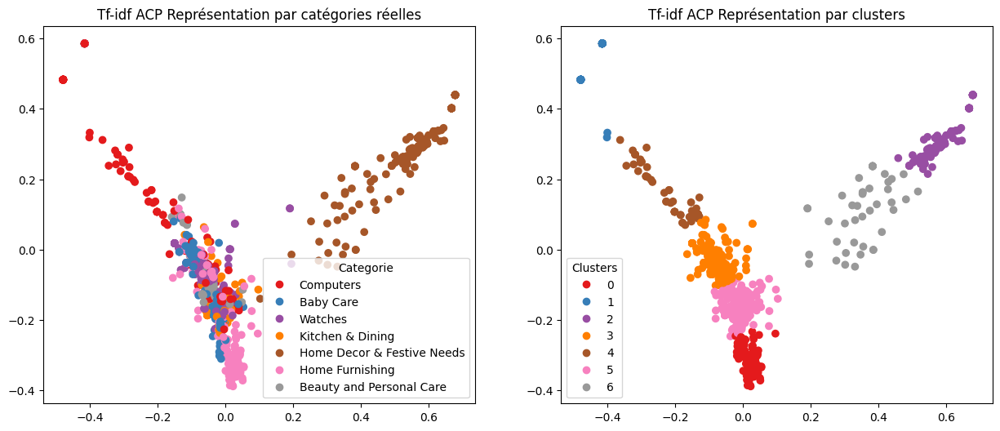

ARI :  0.1882


In [140]:
df_acp_tfidf = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection ACP
ARI, kmeans_acp_labels, df_acp_tfidf, df_compar_method = \
                                    ARI_fct(X_proj=X_proj_acp_tfidf,
                                            Method="Tf-idf_ACP",
                                            init_method="k-means++",
                                            Ninit=10, m_iter=400,
                                            df_donnees=df_text_analysis,
                                            df_analyse=df_acp_tfidf,
                                            df_comparatif=df_compar_method)

dimReduc_visu_fct(X_proj_acp_tfidf, y_cat_num, kmeans_acp_labels, ARI,
                  "Tf-idf ACP ")

#### <font size="+1" color="#e6792e"><b>Clusters - t-SNE - TfidfVectorizer</b></font><br><a name="kmeans_tsne_tfidf"></a>

**Recherche des meilleurs hyperparamètres pour t-SNE**

In [141]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA

liste_param = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results_tfidf = list()
tsne_results_tfidf = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_tfidf = tsne.fit_transform(df_tfidfvec)
    results_tfidf.append(tsne_results_tfidf)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.037s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.588718
[t-SNE] KL divergence after 500 iterations: 0.635286
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.039s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.825096
[t-SNE] KL divergence after 500 iterations: 0.588227
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.1

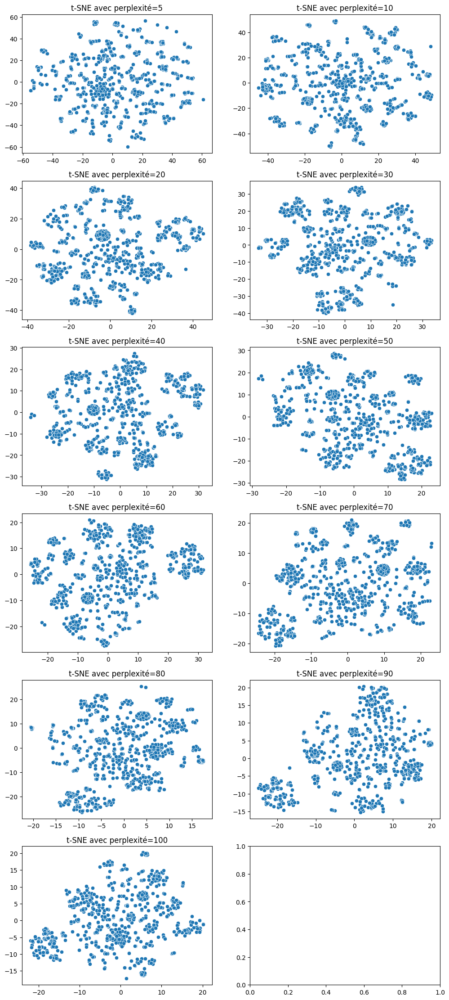

In [142]:
affiche_tsne(results_tfidf, liste_param, 1)

* groupes plus homogènes pour **perplexité=30**
* on laissera les paramètres learning_rate et n_iter par défaut (1000) et le nombre de composants par défaut (2)

In [143]:
# Réduction de dimension tsne
tsne_tifdf = TSNE(verbose=1, perplexity=30)
X_proj_tsne_tfidf = tsne_tifdf.fit_transform(df_tfidfvec)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.116s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.423187
[t-SNE] KL divergence after 1000 iterations: 0.594199


**Recherche des meilleurs hyperparamètres k-means**

In [144]:
type_donnee = "tSNE_Tfidf_DESCR"

In [145]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_proj_tsne_tfidf[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
tSNE_Tfidf_DESCR,10,300,0.549855,13084.647461,0.532302,0.037265
tSNE_Tfidf_DESCR,10,400,0.549855,13084.647461,0.532302,0.039285
tSNE_Tfidf_DESCR,10,200,0.549855,13084.647461,0.532302,0.039384
tSNE_Tfidf_DESCR,10,500,0.549855,13084.647461,0.532302,0.040765
tSNE_Tfidf_DESCR,10,100,0.549855,13084.647461,0.532302,0.043669
tSNE_Tfidf_DESCR,20,400,0.548789,13083.162109,0.533016,0.070871
tSNE_Tfidf_DESCR,20,500,0.548789,13083.162109,0.533016,0.071192
tSNE_Tfidf_DESCR,20,200,0.548789,13083.162109,0.533016,0.078960
tSNE_Tfidf_DESCR,20,100,0.548789,13083.162109,0.533016,0.093373
tSNE_Tfidf_DESCR,20,300,0.548789,13083.162109,0.533016,0.094761


**Calcul ARI et projection t-SNE**

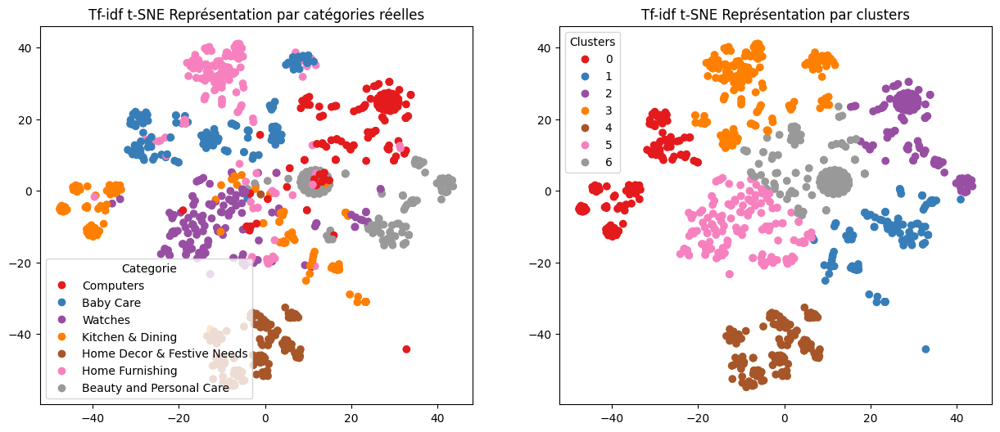

ARI :  0.4593


In [146]:
df_tsne_tfidf = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection t-SNE
ARI, labels, df_tsne_tfidf, df_compar_method = \
                                ARI_fct(X_proj=X_proj_tsne_tfidf,
                                        Method="Tf-idf_tSNE",
                                        init_method="k-means++",
                                        Ninit=20, m_iter=100,
                                        df_donnees=df_text_analysis,
                                        df_analyse=df_tsne_tfidf,
                                        df_comparatif=df_compar_method)

dimReduc_visu_fct(X_proj_tsne_tfidf, y_cat_num, labels, ARI, "Tf-idf t-SNE ")

#### <font size="+1" color="#e6792e"><b>Clusters - ACP+t-SNE - TfidfVectorizer</b></font><br><a name="kmeans_ACP_tsne_tfidf"></a>

**Recherche des meilleurs hyperparamètres pour t-SNE avec initialisation PCA**

In [147]:
# t-SNE tuning du paramètre perplexity avec initialisation PCA
liste_param = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results_tfidf = list()
acptsne_results_tfidf = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    acptsne_results_tfidf = tsne.fit_transform(X_proj_acp_tfidf)
    results_tfidf.append(acptsne_results_tfidf)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.067s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.877663
[t-SNE] KL divergence after 500 iterations: 0.681326
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.043s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.639496
[t-SNE] KL divergence after 500 iterations: 0.679739
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.0

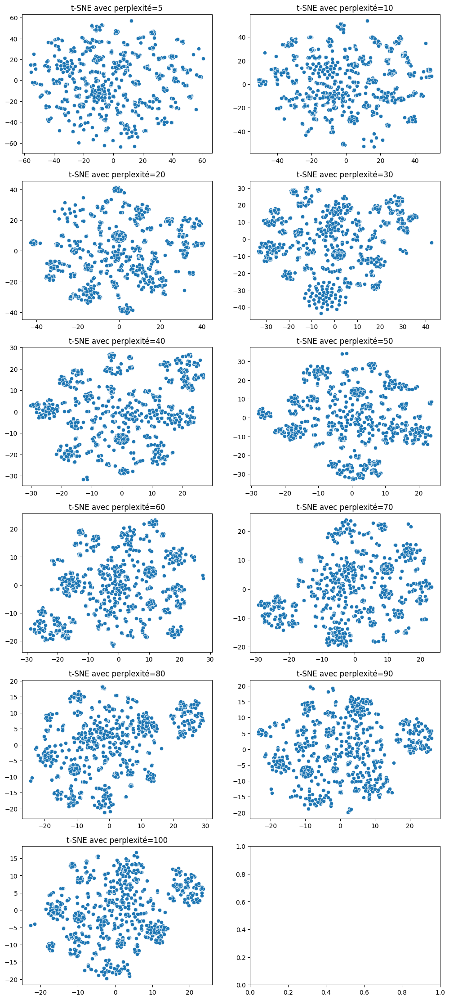

In [148]:
# Visualisation en 2D des différents résultats selon la perplexité
affiche_tsne(results_tfidf, liste_param, 1)

- groupes plus homogènes pour perplexité=30
- on laissera les paramètres learning_rate et n_iter par défaut (1000) et le nombre de composants par défaut (2).

In [149]:
# Réduction de dimension tsne
acptsne_tfidf = TSNE(verbose=1, perplexity=100)
X_proj_acptsne_tfidf = acptsne_tfidf.fit_transform(X_proj_acp_tfidf)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.248s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.564697
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.493996
[t-SNE] KL divergence after 1000 iterations: 0.617166


**Recherche des meilleurs hyperparamètres k-means**

In [150]:
type_donnee = "PCA-tSNE_Tfidf_DESCR"

In [151]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_proj_acptsne_tfidf[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
PCA-tSNE_Tfidf_DESCR,10,400,0.602547,3616.987793,0.437918,0.035228
PCA-tSNE_Tfidf_DESCR,10,500,0.602547,3616.987793,0.437918,0.035571
PCA-tSNE_Tfidf_DESCR,10,300,0.602547,3616.987793,0.437918,0.036139
PCA-tSNE_Tfidf_DESCR,10,200,0.602547,3616.987793,0.437918,1.706173
PCA-tSNE_Tfidf_DESCR,10,100,0.602547,3616.987793,0.437918,1.929537
PCA-tSNE_Tfidf_DESCR,20,500,0.602544,3616.968018,0.437981,0.063004
PCA-tSNE_Tfidf_DESCR,20,400,0.602544,3616.968018,0.437981,0.067287
PCA-tSNE_Tfidf_DESCR,20,300,0.602544,3616.968018,0.437981,0.069627
PCA-tSNE_Tfidf_DESCR,20,200,0.602544,3616.968018,0.437981,0.073035
PCA-tSNE_Tfidf_DESCR,20,100,0.602544,3616.968018,0.437981,0.090704


**Calcul ARI et projection t-SNE avec initialization ACP**

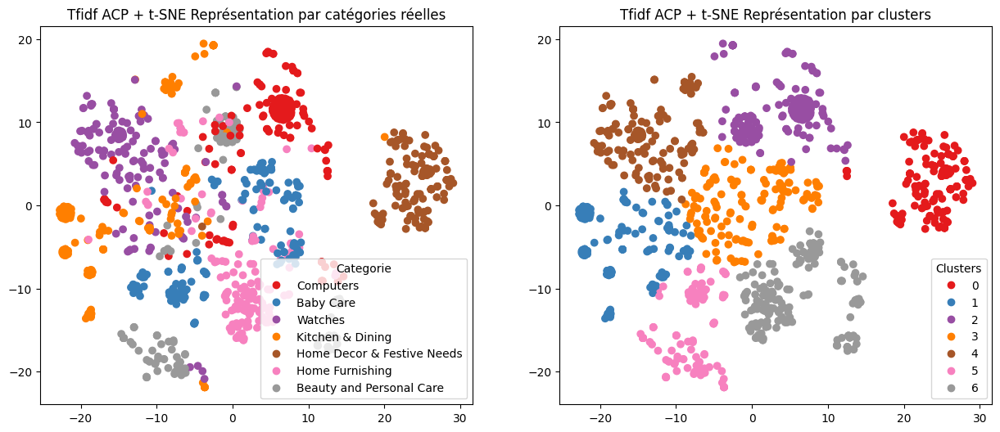

ARI :  0.4132


In [152]:
df_acptsne_tfidf = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection t-SNE
ARI, labels, df_acptsne_tfidf, df_compar_method = \
                            ARI_fct(X_proj=X_proj_acptsne_tfidf,
                                    Method="Tf-idf_ACP_tSNE",
                                    init_method="k-means++",
                                    Ninit=30, m_iter=300,
                                    df_donnees=df_text_analysis,
                                    df_analyse=df_acptsne_tfidf,
                                    df_comparatif=df_compar_method)

dimReduc_visu_fct(X_proj_acptsne_tfidf, y_cat_num, labels, ARI, "Tfidf ACP + t-SNE ")

### <font size="+2" color="#c0553d"><b>2.3.3. Word2Vec<b></font><br><a name="word2vec"></a>

**Hyperparametres**
- **min_count** = int - Ignore tous les mots dont la fréquence absolue totale est inférieure à cette valeur - (2, 100)
- **window** = int - La distance maximale entre le mot actuel et le mot prédit dans une phrase. Par exemple, les mots fenêtre à gauche et les mots fenêtre à gauche de notre cible - (2, 10)
- **vector_size** = int - Dimensionnalité des vecteurs de caractéristiques. - (50, 300)
- **sample** = float - Le seuil pour configurer quels mots à haute fréquence sont aléatoirement sous-échantillonnés. Très influent. - (0, 1e-5)
- **alpha** = float - Le taux d'apprentissage initial - (0.01, 0.05)
- **min_alpha** = float - Le taux d'apprentissage diminuera linéairement jusqu'à min_alpha au fur et à mesure de l'apprentissage. Pour le définir : alpha - (min_alpha * epochs) ~ 0.00
- **negative** = int - Si > 0, un échantillonnage négatif sera utilisé, l'int pour negative spécifie combien de "mots de bruit" doivent être noyés. Si la valeur est 0, aucun échantillonnage négatif n'est utilisé. - (5, 20)
- **workers** = int - Utilisez ce nombre de threads pour entraîner le modèle (=entraînement plus rapide avec des machines multicœurs).
- **sg** : L'algorithme de formation, soit CBOW(0) ou skip gram(1). L'algorithme d'apprentissage par défaut est CBOW.

#### <font size="+1" color="#e6792e"><b>Creation du modèle Word2Vec</b></font><br><a name="creation_modele_w2v"></a>

In [153]:
# Hyperparamètres
w2v_size = 300  # peut être reduite
w2v_window = 4
w2v_min_count = 15
w2v_epochs = 100
maxlen = 250
cores = multiprocessing.cpu_count()
sentences = df_text_analysis["text_bow_lem"].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [154]:
# Création et entraînement du modèle Word2Vec
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                   vector_size=w2v_size,
                                   seed=seed, workers=cores-1)

w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count,
                epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 488
Word2Vec trained


In [155]:
# Préparation des sentences (tokenization)
print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                            maxlen=maxlen,
                            padding='post')

num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 2747


#### <font size="+1" color="#e6792e"><b>Création de la matrice d'embedding Word2Vec</b></font><br><a name="creation_matrice_w2v"></a>

In [156]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i = 0
j = 0

for word, idx in word_index.items():
    i += 1
    if word in w2v_words:
        j += 1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]

word_rate = np.round(j/i, 4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.1777
Embedding matrix: (2747, 300)


#### <font size="+1" color="#e6792e"><b>Création du modèle d'embedding Word2Vec</b></font><br><a name="creation_modele_embedding_w2v"></a>


In [157]:
# Création du modèle

inputs = Input(shape=(len(x_sentences), maxlen), dtype='float64')

word_input = Input(shape=(maxlen), dtype='float64')

word_embedding = Embedding(input_dim=vocab_size, 
                           output_dim=w2v_size,
                           weights=[embedding_matrix],
                           input_length=maxlen)(word_input)

word_vec = GlobalAveragePooling1D()(word_embedding)

embed_model = Model([word_input], word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250)]             0         
                                                                 
 embedding (Embedding)       (None, 250, 300)          824100    
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 824,100
Trainable params: 824,100
Non-trainable params: 0
_________________________________________________________________


#### <font size="+1" color="#e6792e"><b>Exécution du modèle Word2Vec</b></font><br><a name="execution_modele_w2v"></a>

In [158]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 1s 12ms/step


(1050, 300)

#### <font size="+1" color="#e6792e"><b>Clusters - t-SNE - Word2Vec</b></font><br><a name="kmeans_tsne_word2vec"></a>

**Recherche des meilleurs hyperparamètres pour t-SNE**

In [159]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA

liste_param = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results_w2v = list()
tsne_results_w2v = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_w2v = tsne.fit_transform(embeddings)
    results_w2v.append(tsne_results_w2v)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.078s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.372772
[t-SNE] KL divergence after 500 iterations: 0.634580
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.039s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.575569
[t-SNE] KL divergence after 500 iterations: 0.582231
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.0

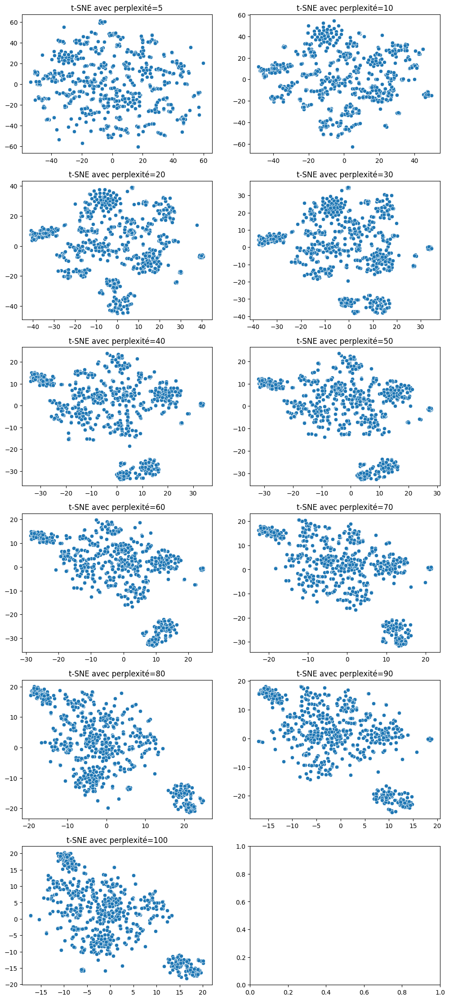

In [160]:
affiche_tsne(results_w2v, liste_param, 1)

* groupes plus homogènes pour **perplexité=30**
* on laissera les paramètres learning_rate et n_iter par défaut (1000) et le nombre de composants par défaut (2)

In [161]:
# Réduction de dimension tsne
tsne_w2v = TSNE(verbose=1, perplexity=20)
X_proj_tsne_w2v = tsne_w2v.fit_transform(embeddings)

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.187s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.837105
[t-SNE] KL divergence after 1000 iterations: 0.526132


**Recherche des meilleurs hyperparamètres k-means**

In [162]:
type_donnee = "tSNE_w2v_DESCR"

In [163]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_proj_tsne_w2v[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
tSNE_w2v_DESCR,30,300,0.579428,17133.000000,0.431573,0.097347
tSNE_w2v_DESCR,30,200,0.579428,17133.000000,0.431573,0.101110
tSNE_w2v_DESCR,30,500,0.579428,17133.000000,0.431573,0.108671
tSNE_w2v_DESCR,30,400,0.579428,17133.000000,0.431573,0.111303
tSNE_w2v_DESCR,30,100,0.579428,17133.000000,0.431573,0.130777
tSNE_w2v_DESCR,50,400,0.579428,17133.000000,0.431573,0.159564
tSNE_w2v_DESCR,50,300,0.579428,17133.000000,0.431573,0.168666
tSNE_w2v_DESCR,50,200,0.579428,17133.000000,0.431573,0.180689
tSNE_w2v_DESCR,50,100,0.579428,17133.000000,0.431573,0.185474
tSNE_w2v_DESCR,50,500,0.579428,17133.000000,0.431573,0.192075


**Calcul ARI et projection t-SNE**

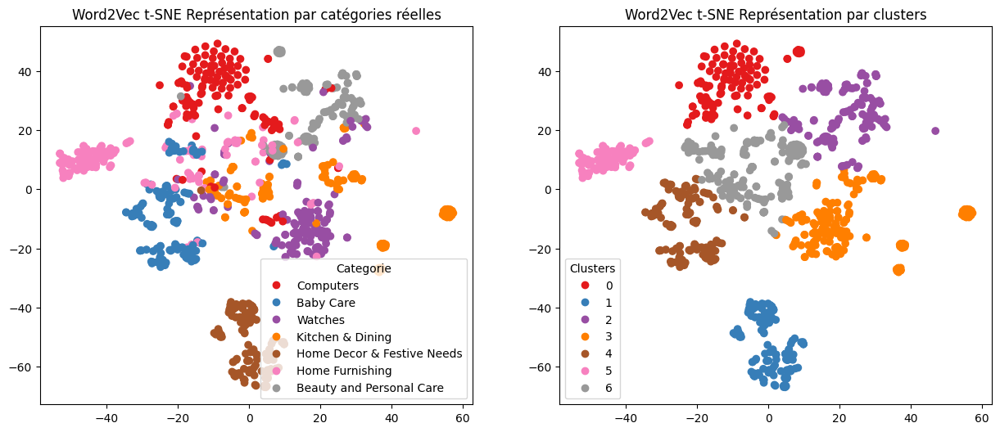

ARI :  0.5177


In [164]:
df_tsne_w2v = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection t-SNE
ARI, labels, df_tsne_w2v, df_compar_method = ARI_fct(X_proj=X_proj_tsne_w2v,
                                                     Method="Word2Vec_tSNE",
                                                     init_method="k-means++",
                                                     Ninit=50, m_iter=400,
                                            df_donnees=df_text_analysis,
                                                     df_analyse=df_tsne_w2v,
                                            df_comparatif=df_compar_method)

dimReduc_visu_fct(X_proj_tsne_w2v, y_cat_num, labels, ARI, "Word2Vec t-SNE ")

### <font size="+2" color="#c0553d"><b>2.3.4. BERT<b></font><br><a name="bert"></a>

- Sentence-transformers utilisant des modèles pré-entraînés sur du vocabulaire anglais

- BERT (Bidirectional Encoder Representations from Transformers) de Google et les méthodes récentes basées sur les transformateurs ont pris d'assaut le paysage de la PNL, en surpassant l'état de l'art dans plusieurs tâches.
- BERT est un transformateur bidirectionnel pour le pré-entraînement sur un grand nombre de données textuelles non étiquetées afin d'apprendre une représentation du langage qui peut être utilisée pour affiner les tâches d'apprentissage automatique spécifiques. Bien que BERT ait surpassé l'état de l'art du traitement automatique des langues dans plusieurs tâches difficiles, l'amélioration de ses performances peut être attribuée au transformateur bidirectionnel, aux nouvelles tâches de préformation du modèle de langage masqué et de la prédiction de la structure suivante, ainsi qu'à un grand nombre de données et à la puissance de calcul de Google.
- BERT fonctionne en deux étapes. Tout d'abord, il utilise une grande quantité de données non étiquetées pour apprendre une représentation du langage d'une manière non supervisée appelée pré-entraînement. Ensuite, le modèle pré-entraîné peut être affiné de manière supervisée en utilisant une petite quantité de données étiquetées pour effectuer diverses tâches supervisées. Les modèles d'apprentissage automatique de pré-entraînement ont déjà connu le succès dans divers domaines, notamment le traitement des images et le traitement du langage naturel (NLP).

[Source](https://towardsdatascience.com/bert-roberta-distilbert-xlnet-which-one-to-use-3d5ab82ba5f8)  [Source](https://towardsdatascience.com/bert-technology-introduced-in-3-minutes-2c2f9968268c) [Source](https://huggingface.co/models)

In [165]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental\
                                  .list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.12.0
2.12.0
Num GPUs Available:  1
True


#### <font size="+1" color="#e6792e"><b>BERT fonctions communes</b></font><br><a name="bert_fonctions_communes"></a>

In [166]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size,
                     mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot =\
            bert_inp_fct(sentences[idx:idx+batch_size],
                         bert_tokenizer, max_length)

        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask,
                                     token_type_ids],
                                    batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']

        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot =\
                np.concatenate((last_hidden_states_tot,last_hidden_states))

    features_bert = np.array(last_hidden_states_tot).mean(axis=1)

    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)

    return features_bert, last_hidden_states_tot

#### <font size="+1" color="#e6792e"><b>BERT HuggingFace</b></font><br><a name="BERT_huggingface"></a>

<span style='background:#e6792e'><span style='color:white'>bert-base-uncased</span></span>

bert-base-uncased:
modèle pré-entraïne sur l'anglais using a masked language modeling. Modèle de base (réduit), uncased (ne fait pas la difference entre majuscules et minuscules).


In [167]:
df_text_analysis["text_dl"].count()

1050

In [168]:
max_length = 40
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = df_text_analysis["text_dl"].to_list()

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.29.2",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}



loading weights file tf_model.h5 from cache at /root/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/tf_model.h5
Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training

In [169]:
# Création des features
features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type,
                                                         sentences,
                                                         max_length,
                                                         batch_size,
                                                         mode='HF')

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.29.2",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}



loading file vocab.txt from cache at /root/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/vocab.txt
loading file tokenizer.json from cache at /root/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/tokenizer.json
loading file added_tokens.json from cache at None
loading file special_tokens_map.json from cache at None
loading file tokenizer_config.json from cache at /root/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/tokenizer_config.json
loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_ac

1/1 [==============================] - 0s 29ms/step
temps traitement :  20.0


#### <font size="+1" color="#e6792e"><b>Clusters - t-SNE - BERT</b></font><br><a name="kmeans_tsne_bert"></a>

**Recherche des meilleurs hyperparamètres pour t-SNE**

In [170]:
features_bert.shape

(1050, 768)

In [171]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA

liste_param = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results_bert = list()
tsne_results_bert = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_bert = tsne.fit_transform(features_bert)
    results_bert.append(tsne_results_bert)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.073s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.722824
[t-SNE] KL divergence after 500 iterations: 0.823566
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.069s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 1.052955
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.501343
[t-SNE] KL divergence after 500 iterations: 0.780703
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.0

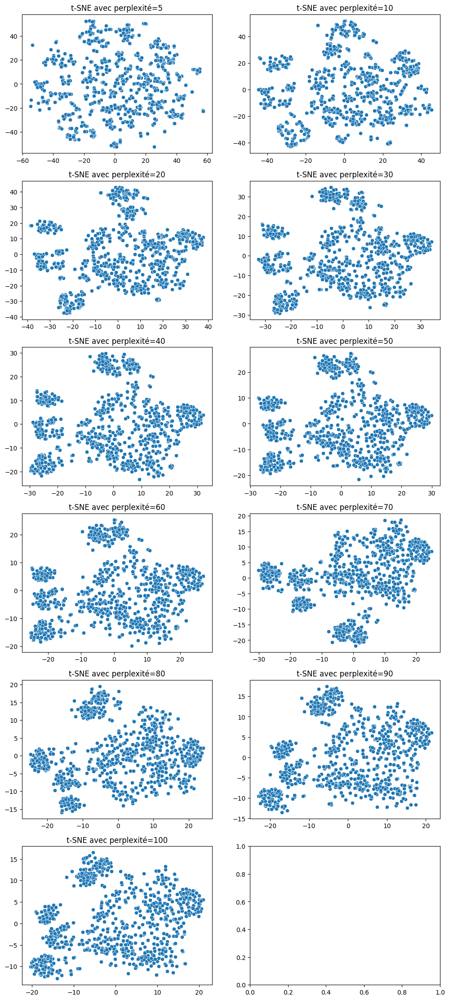

In [172]:
affiche_tsne(results_bert, liste_param, 1)

* groupes plus homogènes pour **perplexité=30**
* on laissera les paramètres learning_rate et n_iter par défaut (1000) et le nombre de composants par défaut (2)

In [173]:
# Réduction de dimension tsne
tsne_bert = TSNE(verbose=1, perplexity=20)
X_proj_tsne_bert = tsne_bert.fit_transform(features_bert)

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.135s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 1.320639
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.833237
[t-SNE] KL divergence after 1000 iterations: 0.680106


**Recherche des meilleurs hyperparamètres k-means**

In [174]:
type_donnee = "tSNE_bert_DESCR"

In [175]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_proj_tsne_bert[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
tSNE_bert_DESCR,10,200,0.579309,15659.697266,0.481102,0.029965
tSNE_bert_DESCR,10,500,0.579309,15659.697266,0.481102,0.030000
tSNE_bert_DESCR,10,400,0.579309,15659.697266,0.481102,0.031861
tSNE_bert_DESCR,10,300,0.579309,15659.697266,0.481102,0.035311
tSNE_bert_DESCR,10,100,0.579309,15659.697266,0.481102,0.038280
tSNE_bert_DESCR,20,400,0.579294,15658.914062,0.481114,0.058777
tSNE_bert_DESCR,20,500,0.579294,15658.914062,0.481114,0.058857
tSNE_bert_DESCR,20,200,0.579294,15658.914062,0.481114,0.060738
tSNE_bert_DESCR,20,300,0.579294,15658.914062,0.481114,0.064072
tSNE_bert_DESCR,20,100,0.579294,15658.914062,0.481114,0.068263


**Calcul ARI et projection t-SNE**

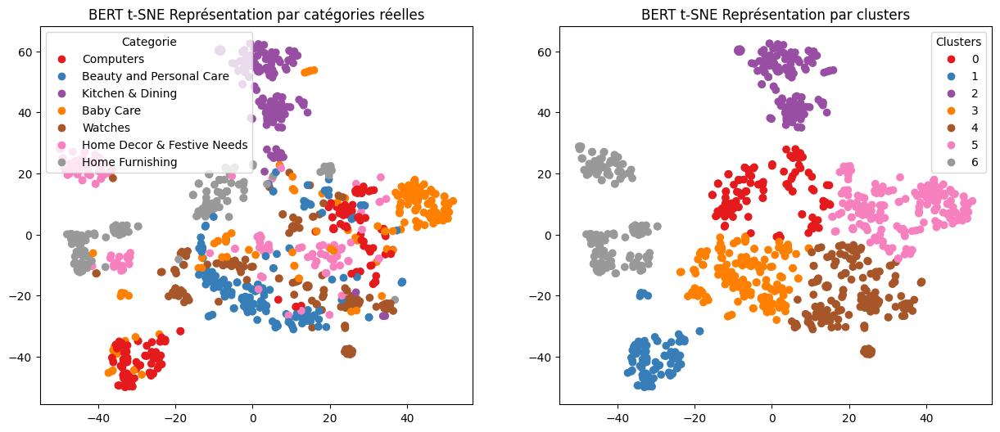

ARI :  0.3558


In [176]:
df_tsne_bert = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection t-SNE
ARI, labels, df_tsne_bert, df_compar_method = ARI_fct(X_proj=X_proj_tsne_bert,
                                                      Method="BERT_tSNE",
                                                      init_method="k-means++",
                                                      Ninit=10, m_iter=300,
                                            df_donnees=df_text_analysis,
                                                      df_analyse=df_tsne_bert,
                                            df_comparatif=df_compar_method)

dimReduc_visu_fct(X_proj_tsne_bert, y_cat_num, labels, ARI, "BERT t-SNE ")

### <font size="+2" color="#c0553d"><b>2.3.5. USE<b></font><br><a name="use"></a>

- Le modèle 'universal sentence encoder model' encode les données textuelles dans des vecteurs de haute dimension appelés embeddings qui sont des représentations numériques des données textuelles. Il vise spécifiquement l'apprentissage par transfert à d'autres tâches de NLP, telles que la classification de textes, la similarité sémantique et le regroupement.

[Source](https://www.analyticsvidhya.com/blog/2020/08/top-4-sentence-embedding-techniques-using-python/)

In [177]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental
                                  .list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.12.0
2.12.0
Num GPUs Available:  1
True


In [178]:
module_url = "https://tfhub.dev/google/universal-sentence-encoder/4"
model = hub.load(module_url)
print("module %s loaded" % module_url)

module https://tfhub.dev/google/universal-sentence-encoder/4 loaded


In [179]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = model(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [180]:
batch_size = 15
sentences = df_text_analysis["text_dl"].to_list()

In [181]:
features_USE = feature_USE_fct(sentences, batch_size)

In [182]:
features_USE.shape

(1050, 512)

#### <font size="+1" color="#e6792e"><b>Clusters - t-SNE - USE</b></font><br><a name="kmeans_tsne_use"></a>

**Recherche des meilleurs hyperparamètres pour t-SNE**

In [183]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA

liste_param = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results_use = list()
tsne_results_use = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_use = tsne.fit_transform(features_USE)
    results_use.append(tsne_results_use)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.087s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000001
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.918320
[t-SNE] KL divergence after 500 iterations: 0.730283
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.055s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.186045
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.928207
[t-SNE] KL divergence after 500 iterations: 0.665814
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.0

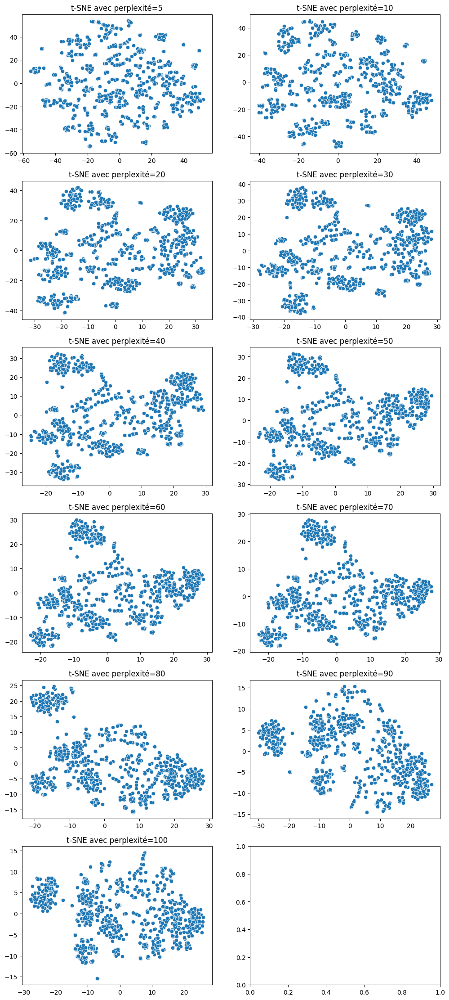

In [184]:
affiche_tsne(results_use, liste_param, 1)

* groupes plus homogènes pour **perplexité=30**
* on laissera les paramètres learning_rate et n_iter par défaut (1000) et le nombre de composants par défaut (2)

In [185]:
# Réduction de dimension tsne
tsne_use = TSNE(verbose=1, perplexity=30)
X_proj_tsne_use = tsne_use.fit_transform(features_USE)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.133s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.314672
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.207855
[t-SNE] KL divergence after 1000 iterations: 0.546767


**Recherche des meilleurs hyperparamètres k-means**

In [186]:
type_donnee = "tSNE_bert_DESCR"

In [187]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_proj_tsne_use[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
tSNE_bert_DESCR,10,200,0.579309,15659.697266,0.481102,0.029965
tSNE_bert_DESCR,10,500,0.579309,15659.697266,0.481102,0.030000
tSNE_bert_DESCR,10,400,0.579309,15659.697266,0.481102,0.031861
tSNE_bert_DESCR,10,300,0.579309,15659.697266,0.481102,0.035311
tSNE_bert_DESCR,10,100,0.579309,15659.697266,0.481102,0.038280
tSNE_bert_DESCR,20,400,0.579294,15658.914062,0.481114,0.058777
tSNE_bert_DESCR,20,500,0.579294,15658.914062,0.481114,0.058857
tSNE_bert_DESCR,20,200,0.579294,15658.914062,0.481114,0.060738
tSNE_bert_DESCR,20,300,0.579294,15658.914062,0.481114,0.064072
tSNE_bert_DESCR,20,100,0.579294,15658.914062,0.481114,0.068263


**Calcul ARI et projection t-SNE**

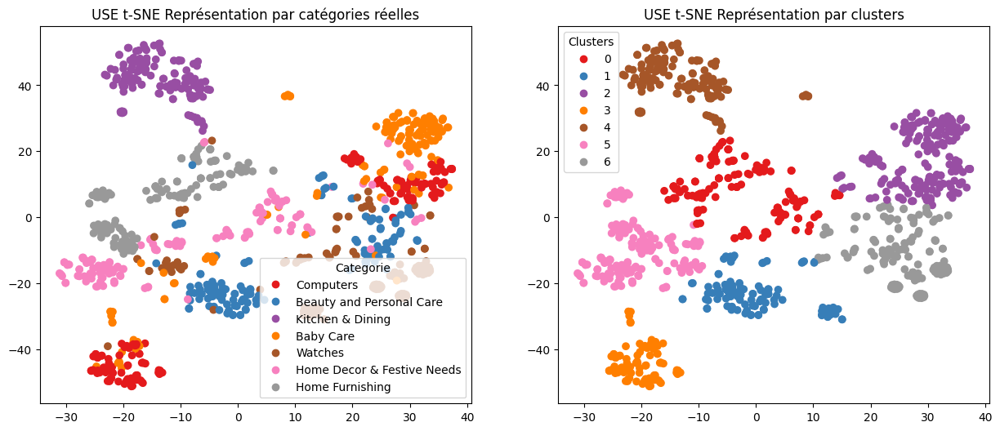

ARI :  0.4378


In [188]:
df_tsne_use = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection t-SNE
ARI, labels, df_tsne_use, df_compar_method = ARI_fct(X_proj=X_proj_tsne_use,
                                                     Method="USE_tSNE",
                                                     init_method="k-means++",
                                                     Ninit=10, m_iter=300,
                                            df_donnees=df_text_analysis,
                                                     df_analyse=df_tsne_use,
                                            df_comparatif=df_compar_method)

dimReduc_visu_fct(X_proj_tsne_use, y_cat_num, labels, ARI, "USE t-SNE ")

---
---

# <font size="+3" color="#5c2835"><b>3. Analyse faisabilité - Images</b></font><br><a name="faisab_img"></a>

## <font size="+2" color="#903b3f"><b>3.1. Premier contact images</b></font><br><a name="prem_images"></a>


In [167]:
# Dossier contenant les images disponibles
path = "/content/drive/MyDrive/Projet6_NLP/P6_travail/p6_source/Images/"

# Taille redimensionement
dim = (224, 224)

# initiate sift
sift = cv2.xfeatures2d.SIFT_create()

# sift descriptors output size
size = 35

### <font size="+2" color="#c0553d"><b>3.1.1. Affichage d'exemples d'images par label<b></font><br><a name="aff_img_lbl"></a>

Computers


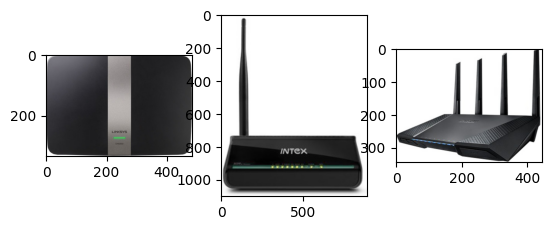

Baby Care


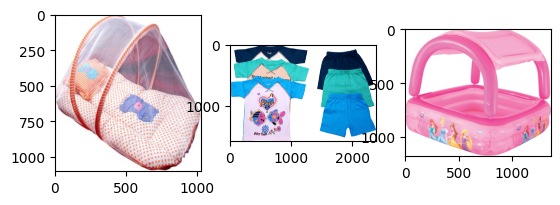

Watches


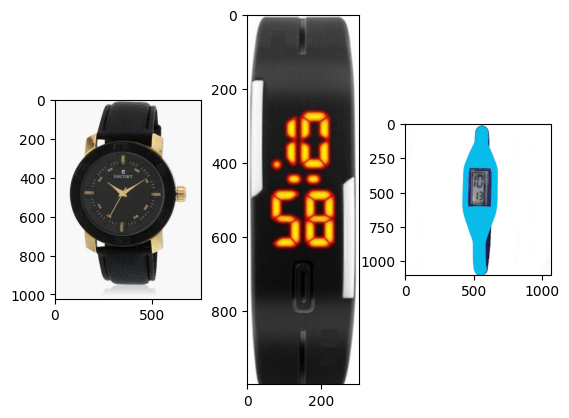

Kitchen & Dining


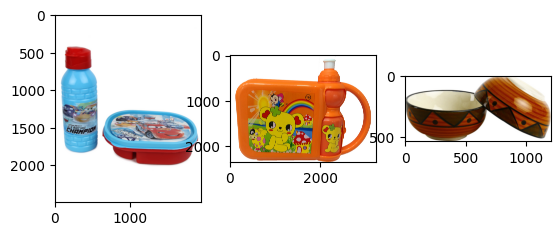

Home Decor & Festive Needs


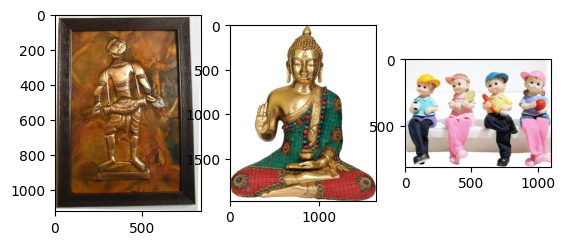

Home Furnishing


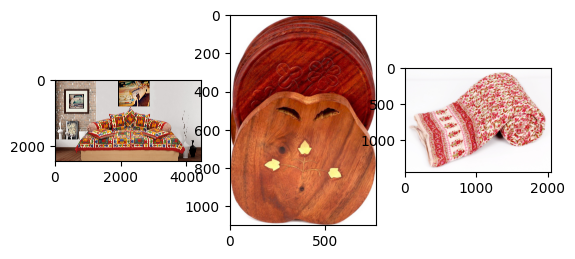

Beauty and Personal Care


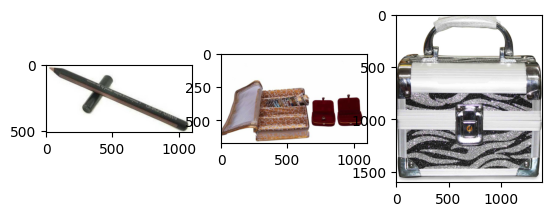

In [168]:
# Fonction pour aider à créer des listes de produits par catégorie
# (on utilise la liste de noms dans le dataset
# parce qu'on lis le nom de catégorie par ligne)

def list_fct(name) :
    list_image_name = [photos_list[i] for i in range(len(df_text_analysis))
                       if df_text_analysis["Categ_N0"][i]==name]
    return list_image_name

# Liste des images dans le dataset
photos_list = df_text_analysis["image"].tolist()

list_home=[photos_list[i] for i in range(len(df_text_analysis))
           if df_text_analysis["Categ_N0"][i]=="Home Furnishing"]

list_baby=[photos_list[i] for i in range(len(df_text_analysis))
           if df_text_analysis["Categ_N0"][i]=="Baby Care"]

list_decor_festive=[photos_list[i] for i in range(len(df_text_analysis))
                    if df_text_analysis["Categ_N0"][i]==
                    "Home Decor & Festive Needs"]

list_beauty_care=[photos_list[i] for i in range(len(df_text_analysis))
                  if df_text_analysis["Categ_N0"][i]==
                  "Beauty and Personal Care"]

list_Watches=[photos_list[i] for i in range(len(df_text_analysis))
              if df_text_analysis["Categ_N0"][i]=="Watches"]

list_Computers=[photos_list[i] for i in range(len(df_text_analysis))
                if df_text_analysis["Categ_N0"][i]=="Computers"]

list_kitchen=[photos_list[i] for i in range(len(df_text_analysis))
              if df_text_analysis["Categ_N0"][i]=="Kitchen & Dining"]

for name in l_cat :
    print(name)
    # print("-------")
    for i in range(3):
        plt.subplot(130 + 1 + i)
        filename = path + list_fct(name)[i+10]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

### <font size="+2" color="#c0553d"><b>3.1.2. Pré-traitement des images<b></font><br><a name="pretrait_img"></a>


In [191]:
print(cv2.__version__)

4.7.0


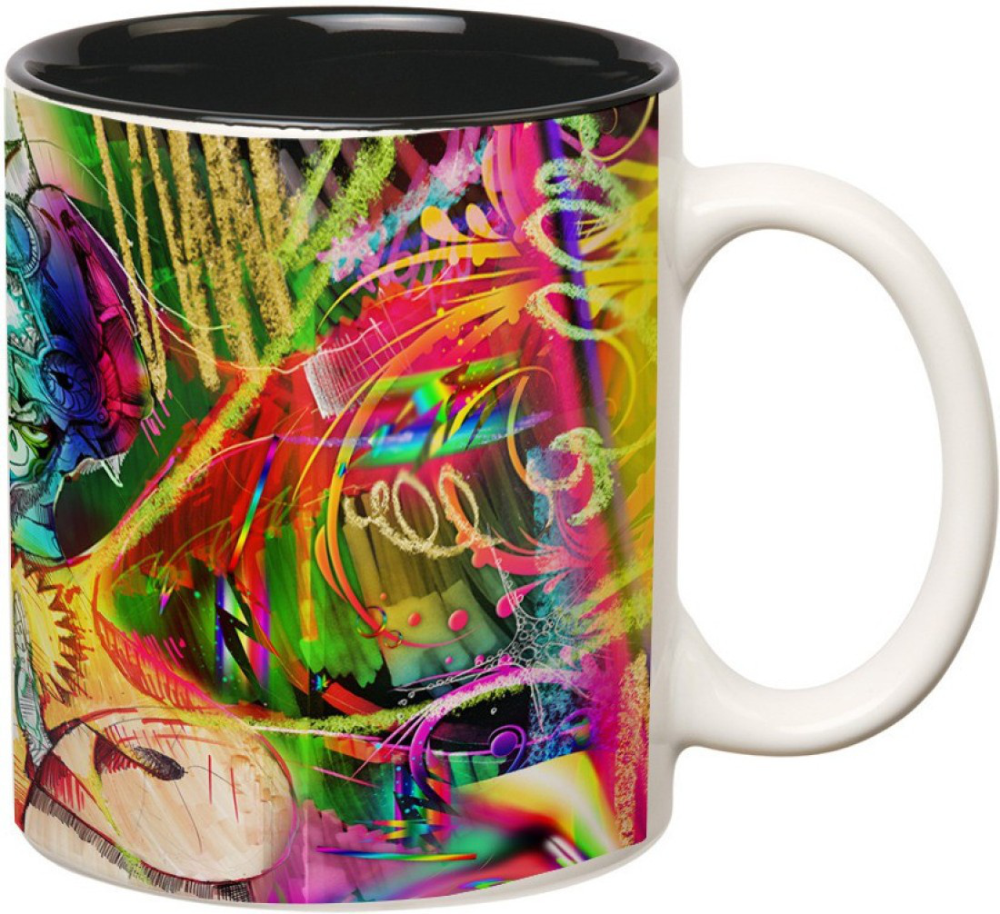

In [192]:
# Chargement de l'image originale
img = Image.open(path + photos_list[184], 'r')
img

(array([    0., 10000., 20000., 30000., 40000., 50000.]),
 [Text(0, 0.0, '0'),
  Text(0, 10000.0, '10000'),
  Text(0, 20000.0, '20000'),
  Text(0, 30000.0, '30000'),
  Text(0, 40000.0, '40000'),
  Text(0, 50000.0, '50000')])

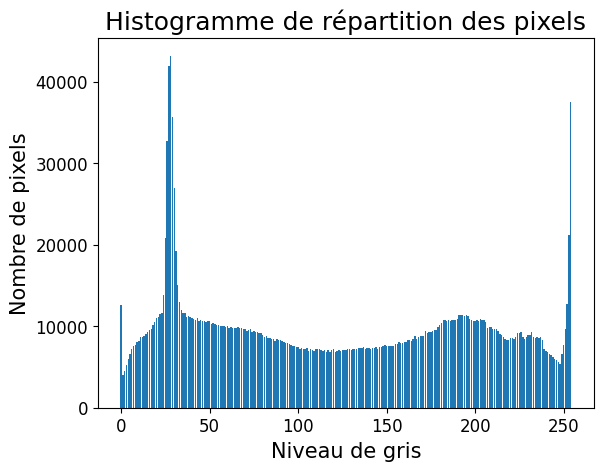

In [193]:
# Histogramme de l'image originale

plt.title('Histogramme de répartition des pixels', fontsize=18)
hist, bins = np.histogram(np.array(img).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=15)
plt.ylabel('Nombre de pixels', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

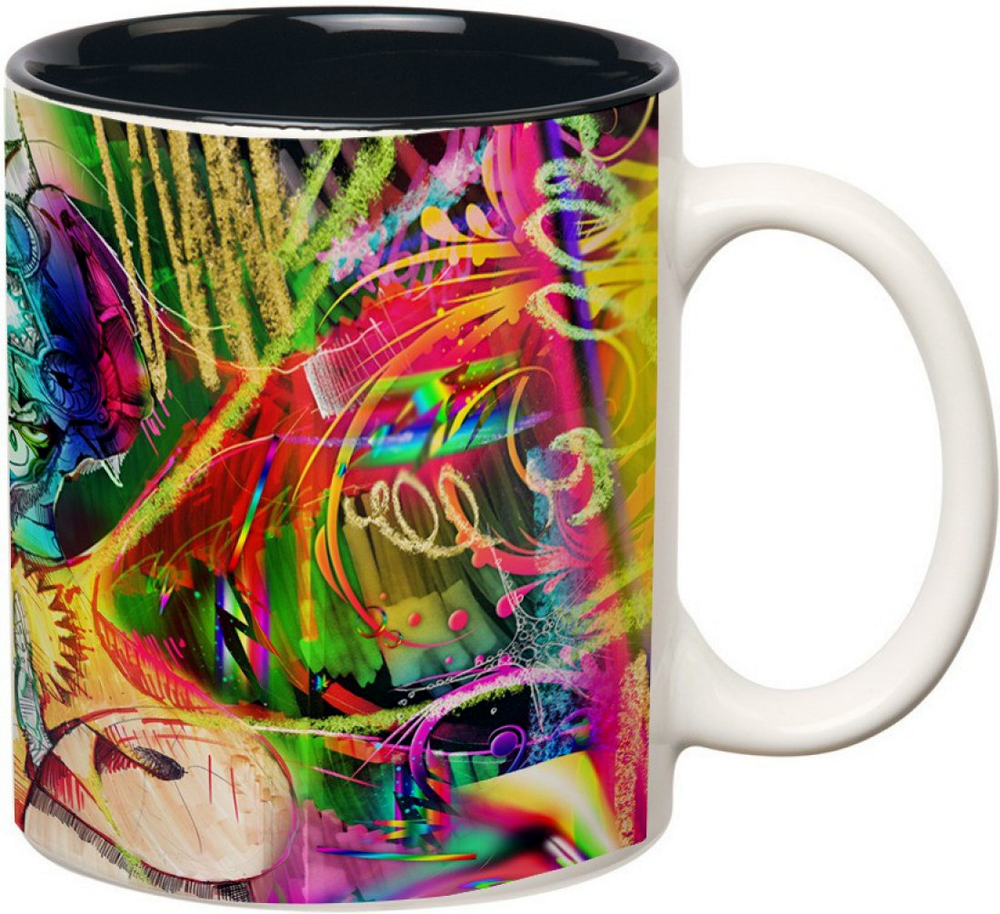

In [194]:
# Correction de l'exposition PILS (étirement de l'histogramme)
img = ImageOps.autocontrast(img, 1)
img

(array([    0.,  5000., 10000., 15000., 20000., 25000., 30000., 35000.,
        40000.]),
 [Text(0, 0.0, '0'),
  Text(0, 5000.0, '5000'),
  Text(0, 10000.0, '10000'),
  Text(0, 15000.0, '15000'),
  Text(0, 20000.0, '20000'),
  Text(0, 25000.0, '25000'),
  Text(0, 30000.0, '30000'),
  Text(0, 35000.0, '35000'),
  Text(0, 40000.0, '40000')])

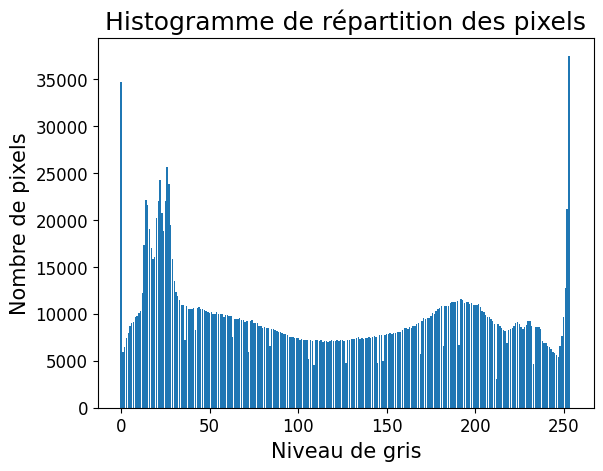

In [195]:
# Histogramme de l'image après correction de l'exposition PILS
plt.title('Histogramme de répartition des pixels', fontsize=18)
hist, bins = np.histogram(np.array(img).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=15)
plt.ylabel('Nombre de pixels', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

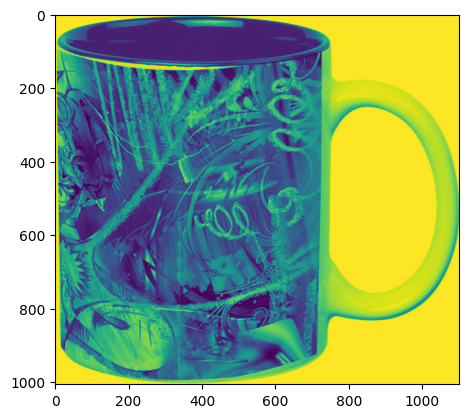

In [196]:
# Conversion en niveau de gris de l'image
img = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY)
plt.imshow(img)

(array([    0.,  2000.,  4000.,  6000.,  8000., 10000., 12000., 14000.,
        16000., 18000.]),
 [Text(0, 0.0, '0'),
  Text(0, 2000.0, '2000'),
  Text(0, 4000.0, '4000'),
  Text(0, 6000.0, '6000'),
  Text(0, 8000.0, '8000'),
  Text(0, 10000.0, '10000'),
  Text(0, 12000.0, '12000'),
  Text(0, 14000.0, '14000'),
  Text(0, 16000.0, '16000'),
  Text(0, 18000.0, '18000')])

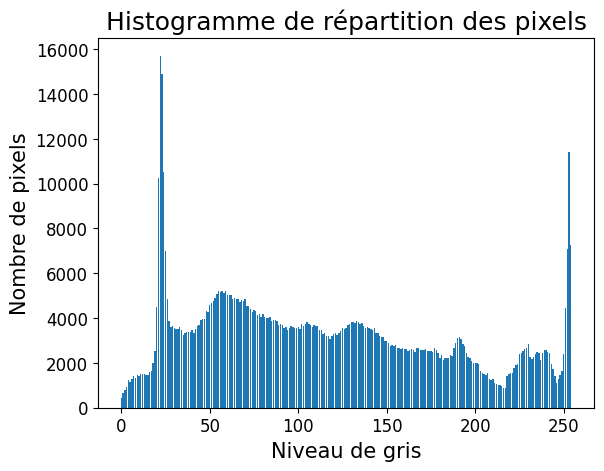

In [197]:
# Histogramme de l'image après la conversion en niveau de gris de l'image
plt.title('Histogramme de répartition des pixels', fontsize=18)
hist, bins = np.histogram(np.array(img).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=15)
plt.ylabel('Nombre de pixels', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

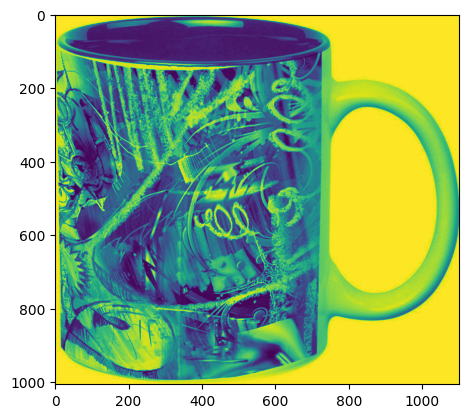

In [198]:
# Correction du contraste OpenCV CLAHE (égalisation de l'histogramme)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
img = clahe.apply(img)
plt.imshow(img)

(array([    0.,  2000.,  4000.,  6000.,  8000., 10000.]),
 [Text(0, 0.0, '0'),
  Text(0, 2000.0, '2000'),
  Text(0, 4000.0, '4000'),
  Text(0, 6000.0, '6000'),
  Text(0, 8000.0, '8000'),
  Text(0, 10000.0, '10000')])

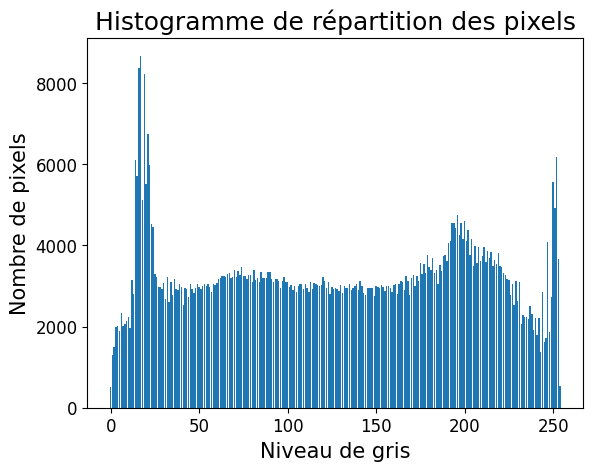

In [199]:
# Histogramme de l'image après correction du contraste OpenCV CLAHE
plt.title('Histogramme de répartition des pixels', fontsize=18)
hist, bins = np.histogram(np.array(img).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=15)
plt.ylabel('Nombre de pixels', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

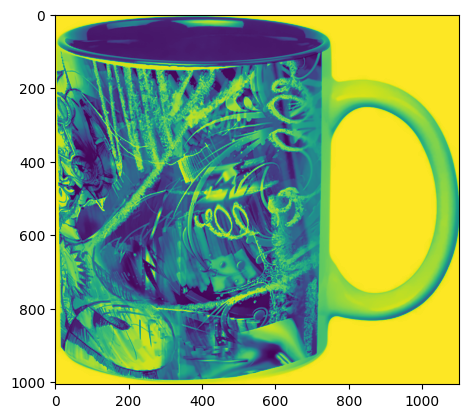

In [200]:
# Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV
img = cv2.fastNlMeansDenoising(img, None, 5, 7, 21)
plt.imshow(img)

(array([    0.,  2500.,  5000.,  7500., 10000., 12500., 15000., 17500.,
        20000., 22500.]),
 [Text(0, 0.0, '0'),
  Text(0, 2500.0, '2500'),
  Text(0, 5000.0, '5000'),
  Text(0, 7500.0, '7500'),
  Text(0, 10000.0, '10000'),
  Text(0, 12500.0, '12500'),
  Text(0, 15000.0, '15000'),
  Text(0, 17500.0, '17500'),
  Text(0, 20000.0, '20000'),
  Text(0, 22500.0, '22500')])

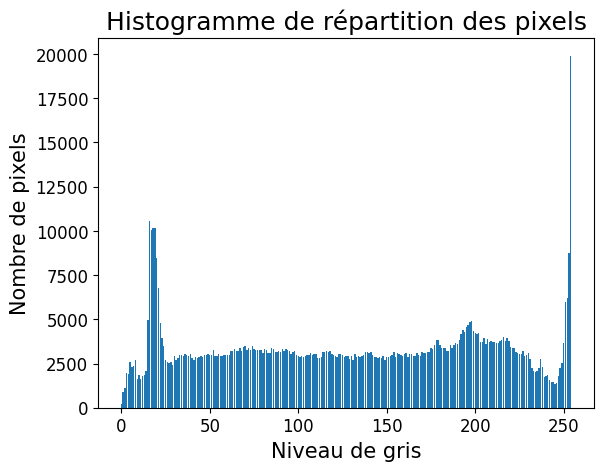

In [201]:
# Histogramme de l'image après la réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV
plt.title('Histogramme de répartition des pixels', fontsize=18)
hist, bins = np.histogram(np.array(img).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=15)
plt.ylabel('Nombre de pixels', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

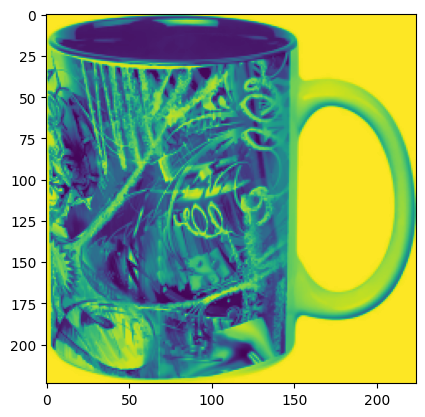

In [202]:
# Redimensionnement en 224 * 224
img = cv2.resize(np.array(img), dim, interpolation=cv2.INTER_AREA)
plt.imshow(img)

(array([  0., 100., 200., 300., 400., 500., 600., 700., 800., 900.]),
 [Text(0, 0.0, '0'),
  Text(0, 100.0, '100'),
  Text(0, 200.0, '200'),
  Text(0, 300.0, '300'),
  Text(0, 400.0, '400'),
  Text(0, 500.0, '500'),
  Text(0, 600.0, '600'),
  Text(0, 700.0, '700'),
  Text(0, 800.0, '800'),
  Text(0, 900.0, '900')])

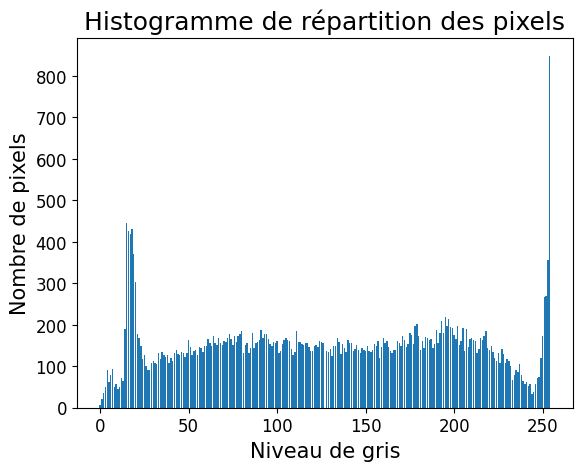

In [203]:
# Histogramme de l'image après le redimensionnement
plt.title('Histogramme de répartition des pixels', fontsize=18)
hist, bins = np.histogram(np.array(img).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=15)
plt.ylabel('Nombre de pixels', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

<font size="+1" color="#e6792e"><b>Détermination et affichage des descripteurs SIFT</b></font><br><a name="deter_affich_feat_sift"></a>

In [204]:
# Identify features from an image using sift method
def pretraite_et_ident_SIFT_feat(picture):
    """3D matrix for each image
    Create features from an image using sift method

    Parameters
    ----------
    picture : name of the picture file

    Return
    ------
    features : 2D matrix for each image

    """
    # Nom de l'image
    img_path = path+picture

    # Chargement de l'image originale
    img = Image.open(img_path, "r")

    # Correction de l'exposition PILS (étirement de l'histogramme)
    img = ImageOps.autocontrast(img, 1)

    # Conversion en niveau de gris de l'image
    img = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY)

    # Correction du contraste OpenCV CLAHE (égalisation de l'histogramme)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
    img = clahe.apply(img)

    # Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV
    img = cv2.fastNlMeansDenoising(img, None, 5, 7, 21)

    # Redimensionnement en 224 * 224
    img = cv2.resize(np.array(img), dim, interpolation=cv2.INTER_AREA)

    # create the keypoints and descriptors
    keypoints = sift.detect(img, None)[:size]
    keypoints, descriptors = sift.compute(img, keypoints)

    # manage missing descriptors
    if descriptors is not None:
        if len(descriptors) >= size:
            features = descriptors
        else:
            features = np.NaN
    else:
        features = np.NaN

    return features


* L'image contient 226 descripteurs
* Chaque descripteur est un vecteur de longueur 128

## <font size="+2" color="#903b3f"><b>3.2. SIFT</b></font><br><a name="SIFT"></a>

### <font size="+2" color="#c0553d"><b>3.2.1. Création des descripteurs de chaque image<b></font><br><a name="descrip_sift"></a>


* création d'une liste de descripteurs par image ("sift_keypoints_by_img") qui sera utilisée pour réaliser les histogrammes par image
* création d'une liste de descripteurs pour l'ensemble des images ("sift_keypoints_all") qui sera utilisé pour créer les clusters de descripteurs

In [205]:
# Transformer les images et identifier les features
df_text_analysis["sift_features"] = df_text_analysis["image"]\
                                    .apply(pretraite_et_ident_SIFT_feat)
df_text_analysis.head(5)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,Categ_N5,Categ_N6,to_preprocess,text_bow_lem,text_dl,lenght_bow_lem,lenght_bow_dl,uniq_tokens_lem,uniq_tokens_dl,sift_features
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing >> Curtains & Accessories >> C...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,...,None,None,Key Features of Elegance Polyester Multicolor ...,key elegance polyester abstract eyelet door cu...,key features of elegance polyester multicolor ...,88,213,88,213,"[[0.0, 12.0, 50.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1...."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,Baby Care >> Baby Bath & Skin >> Baby Bath Tow...,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,...,None,None,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel bath towel red yell...,specifications of sathiyas cotton bath towel b...,42,67,42,67,"[[2.0, 2.0, 0.0, 4.0, 37.0, 41.0, 15.0, 1.0, 1..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,Baby Care >> Baby Bath & Skin >> Baby Bath Tow...,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,...,None,None,Key Features of Eurospa Cotton Terry Face Towe...,key eurospa cotton terry towel size height gsm...,key features of eurospa cotton terry face towe...,95,195,95,195,"[[20.0, 71.0, 74.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing >> Bed Linen >> Bedsheets >> S...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,...,None,None,Key Features of SANTOSH ROYAL FASHION Cotton P...,key santosh royal fashion cotton printed king ...,key features of santosh royal fashion cotton p...,78,121,78,121,"[[27.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 112..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing >> Bed Linen >> Bedsheets >> J...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,...,None,None,Key Features of Jaipur Print Cotton Floral Kin...,key jaipur print cotton floral king sized doub...,key features of jaipur print cotton floral kin...,105,185,105,185,"[[15.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 28..."


In [206]:
# Verifier si toutes les images ont le nombre minimal de descripteurs, 35
data_sift = df_text_analysis[["sift_features", "Categ_N0"]]
data_sift.describe()

,sift_features,Categ_N0
count,1039,1050
unique,1039,7
top,"[[0.0, 12.0, 50.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1....",Home Furnishing
freq,1,150


In [207]:
# Supprimer les images sans le nombre minimal de descripteurs
data_sift = data_sift.dropna()

In [208]:
# Enregistrer les données des catégories réelles
y_cat_num = [
    (1 - l_cat.index(data_sift.iloc[i]["Categ_N0"]))
    for i in range(len(data_sift))]

print()
print("Nombre d'images : ", len(y_cat_num))

# Formater les données
sift_keypoints_by_img = np.asarray(data_sift["sift_features"])
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)


Nombre d'images :  1039

Nombre de descripteurs :  (36365, 128)


### <font size="+2" color="#c0553d"><b>3.2.2. Création des clusters de descripteurs<b></font><br><a name="cluster_descrip_sift"></a>

* Utilisation de MiniBatchKMeans pour obtenir des temps de traitement raisonnables

In [209]:
# Determination number of clusters
temps1 = time.time()

k = int(round(np.sqrt(len(sift_keypoints_all)), 0))
print("Nombre de clusters estimés : ", k)
print("Création de", k, "clusters de descripteurs ...")

# Clustering
kmeans = MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  191
Création de 191 clusters de descripteurs ...


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


temps de traitement kmeans :             0.84 secondes


### <font size="+2" color="#c0553d"><b>3.2.3. Création des features des images<b></font><br><a name="feat_img_sift"></a>

* Pour chaque image : 
   - prédiction du numéro de cluster pour chaque descripteur
   - création d'un histogramme = combien des descripteurs de l'image sont associées à chaque numéro de cluster

Features d'une image = Histogramme d'une image = Comptage pour une image du nombre de descripteurs par cluster

In [210]:
# Creation of histograms (features)
temps1 = time.time()


def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des = len(des)
    if nb_des == 0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :             0.44 secondes


### <font size="+2" color="#c0553d"><b>3.2.4. Réduction de dimension<b></font><br><a name="reduc_dim_sift"></a>

#### <font size="+1" color="#e6792e"><b>Réduction de dimension PCA</b></font><br><a name="PCA_SIFT"></a>

* La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99%)
* L'impact est une meilleure séparation des données via le T-SNE et une réduction du temps de traitement du T-SNE

In [211]:
print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca = pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1039, 191)
Dimensions dataset après réduction PCA :  (1039, 180)


#### <font size="+1" color="#e6792e"><b>Réduction de dimension T-SNE</b></font><br><a name="tSNE_SIFT"></a>


* Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [212]:
# t-SNE tuning du paramètre perplexity avec initialisation PCA
liste_param = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results_SIFT = list()
acptsne_results_SIFT = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    acptsne_results_SIFT = tsne.fit_transform(feat_pca)
    results_SIFT.append(acptsne_results_SIFT)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1039 samples in 0.001s...
[t-SNE] Computed neighbors for 1039 samples in 0.034s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1039
[t-SNE] Computed conditional probabilities for sample 1039 / 1039
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.845581
[t-SNE] KL divergence after 500 iterations: 2.070327
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1039 samples in 0.001s...
[t-SNE] Computed neighbors for 1039 samples in 0.034s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1039
[t-SNE] Computed conditional probabilities for sample 1039 / 1039
[t-SNE] Mean sigma: 0.049764
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.202042
[t-SNE] KL divergence after 500 iterations: 2.159135
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1039 samples in 0.001s...
[t-SNE] Computed neighbors for 1039 samples in 0.0

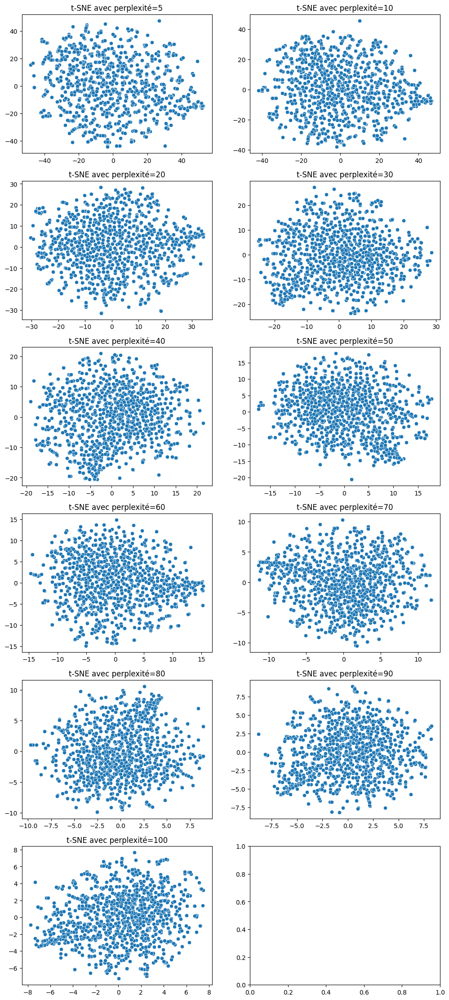

In [213]:
# Visualisation en 2D des différents résultats selon la perplexité
affiche_tsne(results_SIFT, liste_param, 1)

In [214]:
tsne = manifold.TSNE(n_components=2, perplexity=20,
                     n_iter=2000, init='random', random_state=seed)
X_tsne_SIFT = tsne.fit_transform(feat_pca)

df_tsne_SIFT = pd.DataFrame(X_tsne_SIFT[:, 0:2], columns=['tsne1', 'tsne2'])
df_tsne_SIFT["class"] = data_sift["Categ_N0"]
print(df_tsne_SIFT.shape)

(1039, 3)


#### <font size="+1" color="#e6792e"><b>Analyse visuelle : affichage T-SNE selon catégories d'images</b></font><br><a name="visual_analys_sift"></a>


* Les vraies catégories nes sont pas séparées

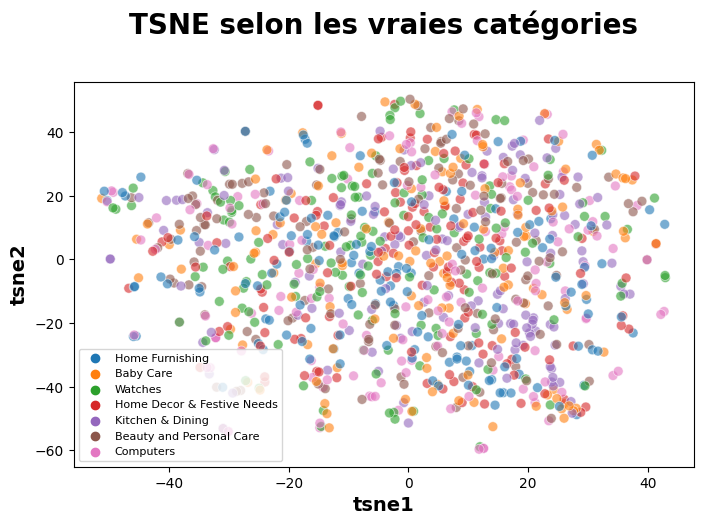

In [215]:
plt.figure(figsize=(8, 5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_SIFT, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies catégories', fontsize=20, pad=35,
          fontweight='bold')
plt.xlabel('tsne1', fontsize=14, fontweight='bold')
plt.ylabel('tsne2', fontsize=14, fontweight='bold')
plt.legend(prop={'size': 8})

plt.show()

#### <font size="+1" color="#e6792e"><b>Analyse par mesures : similarité entre catégories et clusterss</b></font><br><a name="metric_analys_sift"></a>

In [216]:
type_donnee = "SIFT"

##### <font size="+0" color="#ffa600"><b>Création de clusters à partir du T-SNE</b></font><br><a id="cluster_tSNE_sift"></a>

In [217]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_tsne_SIFT[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
SIFT,10,200,0.545496,13669.020508,0.514491,0.039780
SIFT,10,300,0.545496,13669.020508,0.514491,0.040300
SIFT,10,500,0.545496,13669.020508,0.514491,0.055957
SIFT,10,400,0.545496,13669.020508,0.514491,0.060513
SIFT,10,100,0.545496,13669.020508,0.514491,0.077909
SIFT,100,200,0.545410,13666.162109,0.514343,0.369108
SIFT,100,500,0.545410,13666.162109,0.514343,0.371484
SIFT,100,300,0.545410,13666.162109,0.514343,0.372212
SIFT,100,400,0.545410,13666.162109,0.514343,0.388466
SIFT,100,100,0.545410,13666.162109,0.514343,0.427228


##### <font size="+0" color="#ffa600"><b>Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters</b></font><br><a id="img_clusters_ari_sift"></a>

* Le score ARI de 0.015 reste très faible

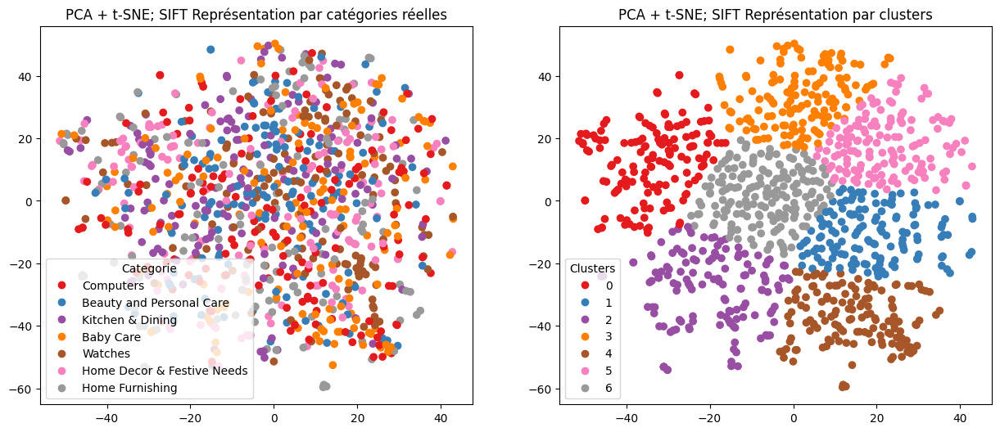

ARI :  0.0163


In [218]:
df_tsne_SIFT = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection t-SNE
ARI, labels, df_tsne_SIFT, df_compar_method = ARI_fct(X_proj=X_tsne_SIFT,
                                                      Method="SIFT_tSNE",
                                                      init_method="k-means++",
                                                      Ninit=10, m_iter=500,
                                                df_donnees=data_sift,
                                                df_analyse=df_tsne_SIFT,
                                                df_comparatif=df_compar_method)

dimReduc_visu_fct(X_tsne_SIFT, y_cat_num, labels, ARI, "PCA + t-SNE; SIFT ")

## <font size="+2" color="#903b3f"><b>3.3. VGG-16</b></font><br><a name="VGG16"></a>

### <font size="+2" color="#c0553d"><b>3.3.1. Création d'un modèle pré-entrainé VGG-16<b></font><br><a name="cr_mdl_preentr_VGG16"></a>

In [169]:
base_model = VGG16()
model = Model(inputs=base_model.inputs, outputs=base_model.layers[-2].output)

print(model.summary())

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

### <font size="+2" color="#c0553d"><b>3.3.2 Création des features des images</b></font><br><a name="ext_feat_VGG16"></a>

In [170]:
images_features = []
i = 0
for image_file in photos_list:
    if i%100 == 0 : print(i)
    i += 1
    image = load_img(path+image_file, target_size=(224, 224))
    image = img_to_array(image) 
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    images_features.append(model.predict(image, verbose=0)[0])  # predict from pretrained model

images_features = np.asarray(images_features)
images_features.shape

0
100
200
300
400
500
600


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


700
800
900
1000


(1050, 4096)

### <font size="+2" color="#c0553d"><b>3.3.3 Réduction dimension et analyse</b></font><br><a name="reduc_dim_VGG16"></a>

In [171]:
# Réduction de dimension PCA
print(images_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca_VGG16 = pca.fit_transform(images_features)
print(feat_pca_VGG16.shape)

(1050, 4096)
(1050, 803)


In [172]:

# t-SNE tuning du paramètre perplexity avec initialisation PCA
liste_param = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results_VGG16 = list()
acptsne_results_VGG16 = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    acptsne_results_VGG16 = tsne.fit_transform(feat_pca_VGG16)
    results_VGG16.append(acptsne_results_VGG16)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.015s...
[t-SNE] Computed neighbors for 1050 samples in 0.110s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.000735
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.948730
[t-SNE] KL divergence after 500 iterations: 1.293688
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.003s...
[t-SNE] Computed neighbors for 1050 samples in 0.079s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 23.338982
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.781113
[t-SNE] KL divergence after 500 iterations: 1.219900
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.003s...
[t-SNE] Computed neighbors for 1050 samples in 0.

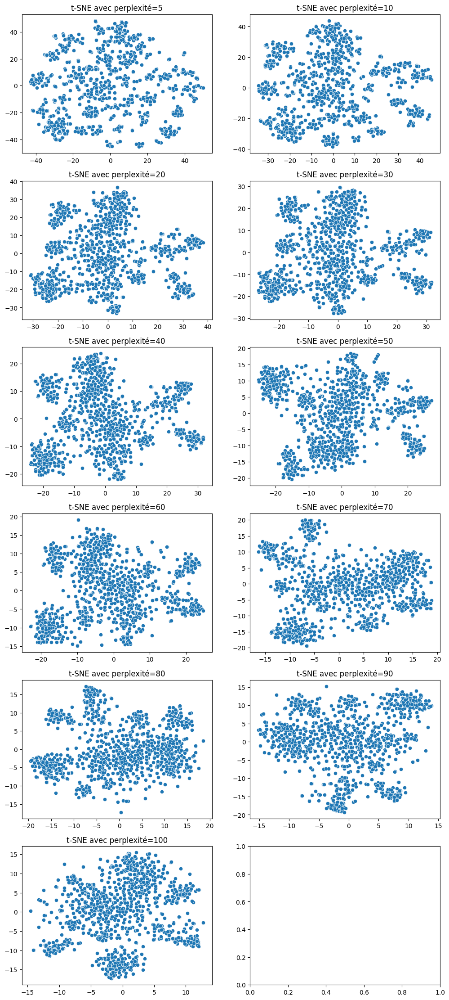

In [173]:
# Visualisation en 2D des différents résultats selon la perplexité
affiche_tsne(results_VGG16, liste_param, 1)

In [174]:
temps1 = time.time()

tsne = manifold.TSNE(n_components=2, perplexity=10,
                     n_iter=2000, init='random', random_state=seed)
X_tsne_VGG16 = tsne.fit_transform(feat_pca_VGG16)

duration1 = time.time()-temps1
print("temps de T-SNE : ", "%15.2f" % duration1, "secondes")

df_tsne_VGG16 = pd.DataFrame(X_tsne_VGG16[:, 0:2], columns=['tsne1', 'tsne2'])
df_tsne_VGG16["class"] = df_text_analysis["Categ_N0"]

print(df_tsne_VGG16.shape)

temps de T-SNE :            15.65 secondes
(1050, 3)


#### <font size="+1" color="#e6792e"><b>Analyse visuelle : affichage T-SNE selon catégories d'images</b></font><br><a name="visual_analys_VGG16"></a>

* Les catégories "Watches", "Beauty and Personal Care", "Kitchen & Dinning", "Home Decor & Festive Needs" et "Computer" sont partiellement séparées

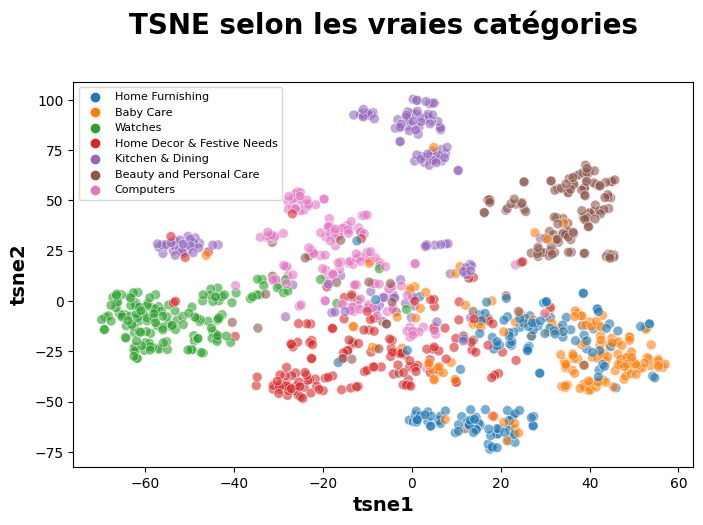

In [175]:
plt.figure(figsize=(8, 5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_VGG16, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies catégories', fontsize=20, pad=35,
          fontweight = 'bold')
plt.xlabel('tsne1', fontsize=14, fontweight='bold')
plt.ylabel('tsne2', fontsize=14, fontweight='bold')
plt.legend(prop={'size': 8})

plt.show()

#### <font size="+1" color="#e6792e"><b>Analyse visuelle : comparaison T-SNE vraies catégories et clusters</b></font><br><a name="visual_categ_cls_VGG16"></a>

**Recherche des meilleurs hyperparamètres k-means**

In [176]:
type_donnee = "VGG16"

In [177]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = calcul_metrics_kmeans(X_tsne_VGG16[:, 0:1],
                                          df_metrics_kmeans,
                                          type_donnee,
                                          seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_kmeans[df_metrics_kmeans["Type_données"] == type_donnee] \
                .sort_values(by=["coef_silh", "davies_bouldin", "Durée (s)"],
                             ascending=[False, True, True])\
                .head(10).style.hide(axis="index")

<ipython-input-7-38b354485ed6>:80: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataframe_metrique = dataframe_metrique.append(pd.DataFrame({


Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
VGG16,70,400,0.585777,24672.179688,0.481881,0.240444
VGG16,70,100,0.585777,24672.179688,0.481881,0.248599
VGG16,70,200,0.585777,24672.179688,0.481881,0.253995
VGG16,70,500,0.585777,24672.179688,0.481881,0.261432
VGG16,70,300,0.585777,24672.179688,0.481881,0.264111
VGG16,80,200,0.585777,24672.179688,0.481881,0.273256
VGG16,80,500,0.585777,24672.179688,0.481881,0.283195
VGG16,80,400,0.585777,24672.179688,0.481881,0.289753
VGG16,80,100,0.585777,24672.179688,0.481881,0.294232
VGG16,100,300,0.585777,24672.179688,0.481881,0.338138


In [178]:
# Enregistrement des vraies catégories
y_cat_num = [(1-l_cat.index(df_text_analysis.iloc[i]['Categ_N0']))\
                             for i in range(len(df_text_analysis))]

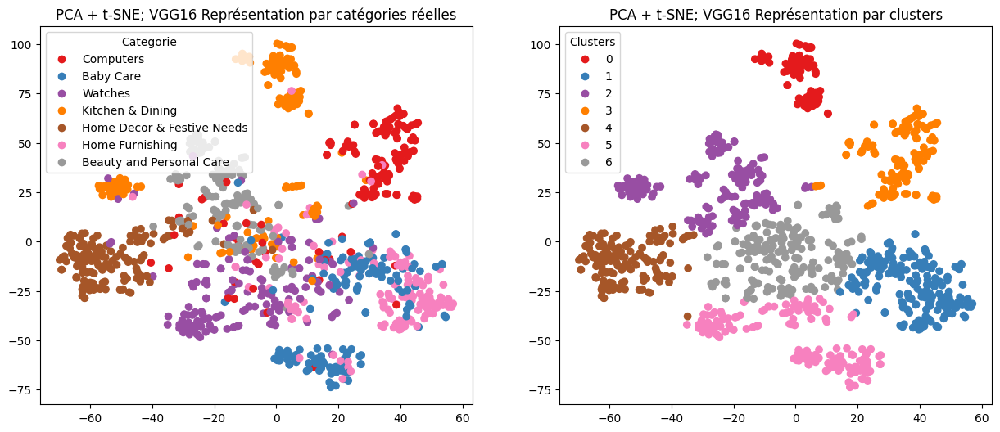

ARI :  0.4437


In [179]:
df_tsne_VGG16 = pd.DataFrame()
# Calcul ARI entre vraies catégories et clusters et projection t-SNE
ARI, labels, df_tsne_VGG16, df_compar_method = ARI_fct(X_proj=X_tsne_VGG16,
                                                       Method="VGG16_tSNE",
                                                       init_method="k-means++",
                                                       Ninit=70, m_iter=500,
                                                df_donnees=df_text_analysis,
                                                df_analyse=df_tsne_VGG16,
                                                df_comparatif=df_compar_method)

dimReduc_visu_fct(X_tsne_VGG16, y_cat_num, labels, ARI, "PCA + t-SNE; VGG16 ")

* L'analyse graphique montre visuellement qu'il est réalisable de séparer automatiquement les images selon leurs vraies classes
* Ceci suffit à démontrer la faisabilité de réaliser ultérieurement une classification supervisée pour déterminer automatiquement les classes des images

---
---

# <font size="+3" color="#5c2835"><b>4. Comparaison des performances</b></font><br><a name="comp_perform_all"></a>

In [180]:
df_compar_method=df_compar_method.sort_values(by="ARI_score")
df_compar_method

,Method_used,ARI_score,Computing_time
0,CountVectorizer_ACP,0.0387,0.0443
0,Tf-idf_ACP,0.1882,0.0511
0,CountVectorizer_t-SNE,0.3252,0.0680
0,CountVectorizer_ACP_tSNE,0.3901,0.0515
0,Tf-idf_ACP_tSNE,0.4132,0.1380
0,VGG16_tSNE,0.4437,0.3110
0,Tf-idf_tSNE,0.4593,0.0893
0,Word2Vec_tSNE,0.5177,0.1849


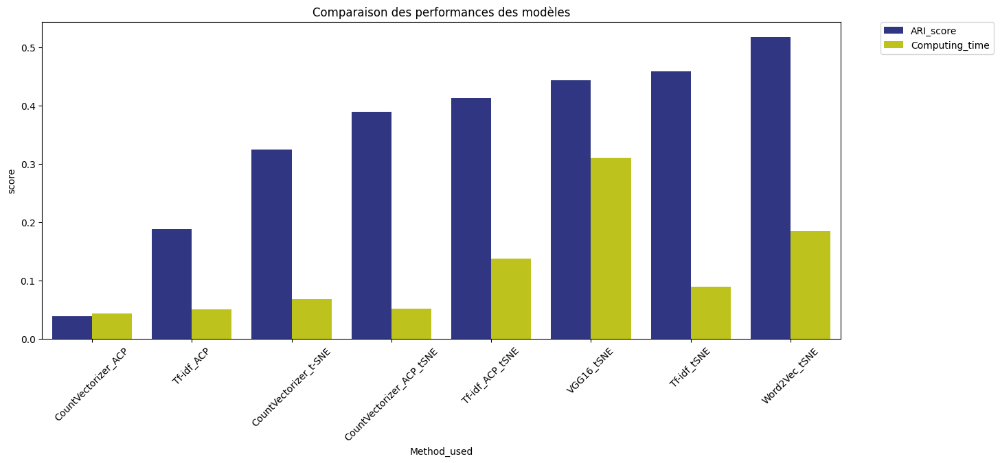

In [181]:
# Comparaison des algorithmes
comparaison_melt = pd.melt(df_compar_method, id_vars=["Method_used"],
                           value_name="score", value_vars=["ARI_score",
                                                           "Computing_time"])

# Visualisation
plt.figure(figsize=(15,6))
sns.barplot(x=comparaison_melt["Method_used"],
            y=comparaison_melt["score"], hue=comparaison_melt["variable"],
            palette=["#222b8f", "#d7de00"])
plt.xticks(rotation=45)
plt.title("Comparaison des performances des modèles", fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=10)
plt.show()

* Les meilleurs résultats sont obtenus avec :
   * Word2Vec pour l'analyse du texte
   * VGG-16 pour l'analyse des images


## <font size="+2" color="#903b3f"><b>4.1. Analyse des erreurs Word2Vec</b></font><br><a name="erreurs_word2vec"></a>



In [182]:
from sklearn import preprocessing


# Encodage des catégories
le = preprocessing.LabelEncoder()
le.fit(df_tsne_w2v["CATEGORIE"])
df_tsne_w2v["Categ"] = le.transform(df_tsne_w2v["CATEGORIE"])

df_tsne_w2v.head()

,VAR1,VAR2,CATEGORIE,Clusters,Categ
0,-34.516125,-7.813274,Home Furnishing,4,4
1,-22.947941,14.663829,Baby Care,6,0
2,-23.473318,14.025209,Baby Care,6,0
3,-27.696102,1.629202,Home Furnishing,4,4
4,-28.651167,1.679604,Home Furnishing,4,4


Clusters,num_entries,Frequency_%
3,195,18.571429
6,186,17.714286
2,161,15.333333
1,149,14.190476
4,145,13.809524
0,130,12.380952
5,84,8.000000


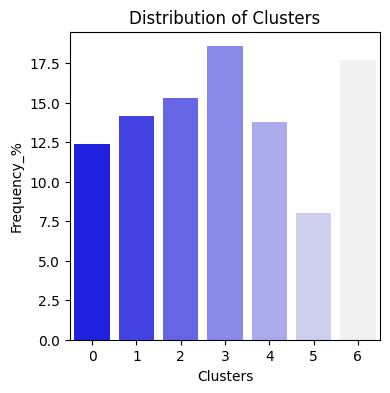

In [183]:
affichage_clusters(df_tsne_w2v, "Clusters")

In [184]:
# Les catégories par clusters
df_tsne_w2v.groupby("Clusters")["CATEGORIE"].value_counts().to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Beauty and Personal Care          113
         Computers                          11
         Baby Care                           5
         Home Decor & Festive Needs          1
1        Watches                           149
2        Computers                         110
         Beauty and Personal Care           19
         Home Decor & Festive Needs         14
         Kitchen & Dining                   13
         Baby Care                           5
3        Home Decor & Festive Needs        108
         Kitchen & Dining                   74
         Beauty and Personal Care            8
         Baby Care                           4
         Home Furnishing                     1
4        Home Furnishing                   125
         Baby Care                           9
         Home Decor & Festive Needs          8
         Kitchen & Dining                    2
         Beauty and Personal Care            1
5        Baby Care                          84
6        Kitchen & Dining                   61
         Baby Care                          43
         Computers                          29
         Home Furnishing                    24
         Home Decor & Festive Needs         19
         Beauty and Personal Care            9
         Watches                             1

In [185]:
categ_vraie_w2v = df_tsne_w2v["Categ"]
cluster_w2v = df_tsne_w2v["Clusters"]


conf_mat = metrics.confusion_matrix(categ_vraie_w2v, cluster_w2v)
print(conf_mat)

[[  5   0   5   4   9  84  43]
 [113   0  19   8   1   0   9]
 [ 11   0 110   0   0   0  29]
 [  1   0  14 108   8   0  19]
 [  0   0   0   1 125   0  24]
 [  0   0  13  74   2   0  61]
 [  0 149   0   0   0   0   1]]


In [186]:
def conf_mat_transform(y_true, y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    corresp = np.argmax(conf_mat, axis=0)
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

In [187]:
cluster_transform_w2v = conf_mat_transform(categ_vraie_w2v, cluster_w2v)
conf_mat_w2v = metrics.confusion_matrix(categ_vraie_w2v, cluster_transform_w2v)
print(conf_mat_w2v)
print()
print(metrics.classification_report(categ_vraie_w2v, cluster_transform_w2v))

Correspondance des clusters :  [1 6 2 3 4 0 5]
[[ 84   5   5   4   9  43   0]
 [  0 113  19   8   1   9   0]
 [  0  11 110   0   0  29   0]
 [  0   1  14 108   8  19   0]
 [  0   0   0   1 125  24   0]
 [  0   0  13  74   2  61   0]
 [  0   0   0   0   0   1 149]]

              precision    recall  f1-score   support

           0       1.00      0.56      0.72       150
           1       0.87      0.75      0.81       150
           2       0.68      0.73      0.71       150
           3       0.55      0.72      0.63       150
           4       0.86      0.83      0.85       150
           5       0.33      0.41      0.36       150
           6       1.00      0.99      1.00       150

    accuracy                           0.71      1050
   macro avg       0.76      0.71      0.72      1050
weighted avg       0.76      0.71      0.72      1050



<Axes: >

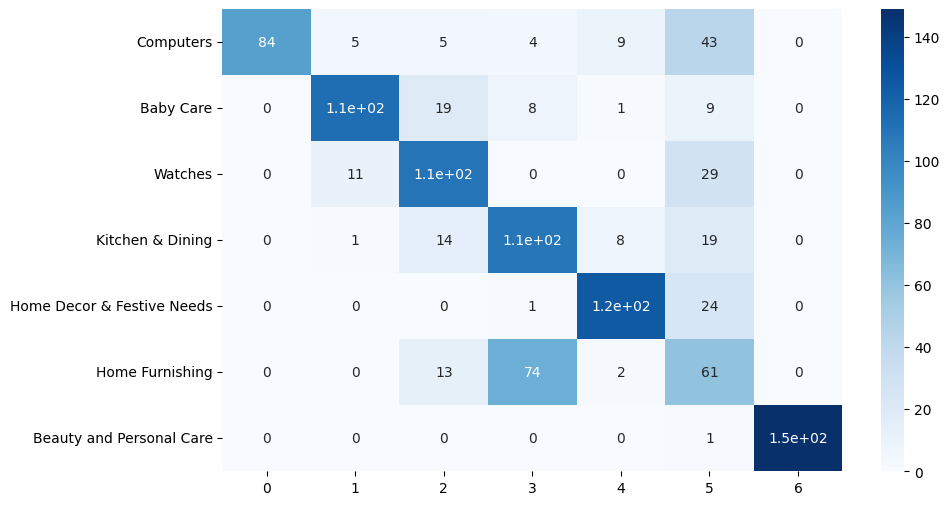

In [188]:
df_cm_w2v = pd.DataFrame(conf_mat_w2v, index=[categ for categ in l_cat],
                     columns=[i for i in "0123456"])

plt.figure(figsize=(10, 6))
sns.heatmap(df_cm_w2v, annot=True, cmap="Blues")

## <font size="+2" color="#903b3f"><b>4.2. Analyse des erreurs VGG-16</b></font><br><a name="erreurs_VGG16"></a>

In [189]:
# Encodage des catégories
le = preprocessing.LabelEncoder()
le.fit(df_tsne_VGG16["CATEGORIE"])
df_tsne_VGG16["Categ"] = le.transform(df_tsne_VGG16["CATEGORIE"])

df_tsne_VGG16.head()

,VAR1,VAR2,CATEGORIE,Clusters,Categ
0,5.927439,-59.495407,Home Furnishing,5,4
1,26.848511,-17.280401,Baby Care,1,0
2,33.018311,-13.495440,Baby Care,1,0
3,22.752302,-57.162449,Home Furnishing,5,4
4,27.271561,-62.080994,Home Furnishing,5,4


In [190]:
categ_vraie_VGG16 = df_tsne_VGG16["Categ"]
cluster_VGG16 = df_tsne_VGG16["Clusters"]

In [191]:
conf_mat_VGG16 = metrics.confusion_matrix(categ_vraie_VGG16, cluster_VGG16)
print(conf_mat_VGG16)

[[  1 108   2   3   0  17  19]
 [  0   3   6 118   3   2  18]
 [  0   1 103   1   1   1  43]
 [  0   6   5   1   4  70  64]
 [  0  72   1   0   0  67  10]
 [ 78   0  36   5   0   0  31]
 [  0   0  10   0 138   0   2]]


In [192]:
cluster_transform = conf_mat_transform(categ_vraie_VGG16, cluster_VGG16)
conf_mat_VGG16 = metrics.confusion_matrix(categ_vraie_VGG16,
                                          cluster_transform_VGG16)
print(conf_mat_VGG16)
print()
print(metrics.classification_report(categ_vraie_VGG16, cluster_transform_VGG16))

Correspondance des clusters :  [5 0 2 1 6 3 3]
[[108   3   2  36   0   1   0]
 [  3 118   6  20   0   0   3]
 [  1   1 103  44   0   0   1]
 [  6   1   5 134   0   0   4]
 [ 72   0   1  77   0   0   0]
 [  0   5  36  31   0  78   0]
 [  0   0  10   2   0   0 138]]

              precision    recall  f1-score   support

           0       0.57      0.72      0.64       150
           1       0.92      0.79      0.85       150
           2       0.63      0.69      0.66       150
           3       0.39      0.89      0.54       150
           4       0.00      0.00      0.00       150
           5       0.99      0.52      0.68       150
           6       0.95      0.92      0.93       150

    accuracy                           0.65      1050
   macro avg       0.63      0.65      0.61      1050
weighted avg       0.63      0.65      0.61      1050



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<Axes: >

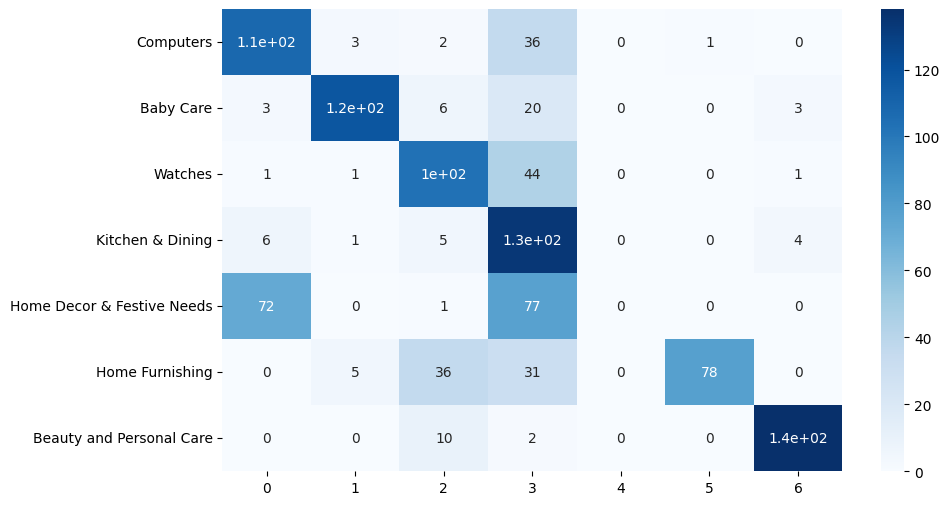

In [193]:
df_cm_VGG16 = pd.DataFrame(conf_mat_VGG16, index=[categ for categ in l_cat],
                     columns=[i for i in "0123456"])

plt.figure(figsize=(10, 6))
sns.heatmap(df_cm_VGG16, annot=True, cmap="Blues")